# Прогнозирование температуры для процесса ковшового рафинирования

## Описание проекта

Металлургической компании «Стальная птица» нужна наша помощь в оптимизации одного из процессов металлургического производства: ковшового рафинирования, целью которого является удаление нежелательных элементов и примесей, таких как сера, фосфор и другие вещества.

Во время ковшового рафинирования могут быть реализованы различные операции, такие как повторный нагрев стали, легирование, раскисление, десульфурация и модификация включений. Перемешивание стали при продувке аргоном способствует гомогенизации, удалению включений и реакциям сталь/шлак (побочный продукт рафинирования расплавленной стали). Этот процесс включает в себя различные мультифизические явления и многофазные реакции, поэтому необходима вычислительная модель, чтобы иметь возможность коррелировать различные явления между собой.

Во время процесса вводятся различные материалы, такие как марганец, никель, хром, проволока или порошок, для легирования расплавленного металла. Одной из особенностей этого процесса, чтобы добиться успеха и получить правильный продукт с желаемыми характеристиками, является то, что температура должна быть оптимальной, около 1600°С, не слишком высокой и не слишком низкой. Однако во время процесса происходят большие потери тепла из-за:
- теплообмен с ковшом (поглощение, теплопроводность, конвекция, излучение)
- образование шлака на поверхности расплавленной стали
- плавление легирующих добавок в ковше

Для поддержания нужной температуры расплавленный металл разогревается электрической дугой благодаря графитовым электродам, расположенным на крышках ковша. Однако потребление электроэнергии для компании может быть высоким. Вот почему нас попросили создать модель для прогнозирования температуры ковша, чтобы сэкономить деньги, например, за счет оптимизации использования электродов, оптимизации мониторинга температуры.
Эта модель будет включать в себя различные операции, упомянутые выше, благодаря предоставленной базе данных, в которой собраны все элементы, необходимые нам для создания модели.

## Цель исследованния

Создайте модель для прогнозирования температуры расплавленного металла во время металлургического процесса ковшового рафинирования.

## Ходь исследованния

- Сначала мы собираемся загрузить и изучить наши наборы данных.
- Во-вторых, мы собираемся работать с наборами данных, проверяя наличие пропущенных значений, дубликатов, выбросов и аномалий, а затем создавать новые признаки. Затем мы проведем EDA наших наборов данных. Затем мы подготовим наш набор данных для обучения нашей модели.
- В-третьих, с помошю кросс-валидации выберем лучшие модел по метрику MAE. 
- В-четвертых, мы протестируем нашу модель, определим, каковы наиболее важные признаки являються и сделаем вывод о применимости нашей модели.

## Загрузка библиотек и модулов

In [1]:
# Установляем новые модули
!pip -q install -U numba
!pip -q install -U 'scikit-learn'
!pip -q install 'numpy == 1.24.4'
!pip -q install sweetviz
!pip -q install -U seaborn
!pip -q install missingno
!pip -q install phik
!pip -q install sqlalchemy

In [2]:
# Импортируем модулей
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import sweetviz as sv
import phik
from sqlalchemy import create_engine
import lightgbm as lgb

from sklearn.model_selection import train_test_split

# загружаем модуль пермутации
from sklearn.inspection import permutation_importance

# загружаем класс pipeline
from sklearn.pipeline import Pipeline

# загружаем классы для подготовки данных
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

# загружаем функцию для работы с метриками
from sklearn.metrics import r2_score, mean_absolute_error

# загружаем нужные модели для регресси
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyRegressor
from sklearn.neural_network import MLPRegressor

# импортируем класс RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.inspection import permutation_importance

import warnings
warnings.filterwarnings('ignore')

## Загрузка датабаза

In [3]:
# Получение база данных
!wget https://code.s3.yandex.net/data-scientist/ds-plus-final.db 

path_to_db = 'ds-plus-final.db'
engine = create_engine(f'sqlite:///{path_to_db}', echo=False) 

--2025-04-12 17:17:46--  https://code.s3.yandex.net/data-scientist/ds-plus-final.db
Resolving code.s3.yandex.net (code.s3.yandex.net)... 93.158.134.158, 2a02:6b8::2:158
Connecting to code.s3.yandex.net (code.s3.yandex.net)|93.158.134.158|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3588096 (3.4M) [application/octet-stream]
Saving to: ‘ds-plus-final.db.3’

ds-plus-final.db.3  100%[===================>]   3.42M  4.93MB/s    in 0.7s    

2025-04-12 17:17:47 (4.93 MB/s) - ‘ds-plus-final.db.3’ saved [3588096/3588096]



# Загрузка данных

## Загрузка steel.data_arc

In [4]:
# Запрос на получение таблицы, содержащей данные об электродах
query_arc = '''
            SELECT key,
                   `Начало нагрева дугой` AS begin_heat,
                   `Конец нагрева дугой` AS end_heat,
                   `Активная мощность` AS active_power,
                   `Реактивная мощность` AS reactive_power
            FROM data_arc
        '''

In [5]:
# Создание нашего датафрейма данных, содержащего данные о сгенерированных дугах.
df_arc = pd.read_sql_query(query_arc, con = engine, parse_dates=['begin_heat', 'end_heat'])

In [6]:
# Отображение 10-й первой строки датафрейма
df_arc.head(10)

,key,begin_heat,end_heat,active_power,reactive_power
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.381124,0.220351
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,0.261665,0.205527
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.710297,0.484962
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.786322,0.542517
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.101678,0.820856


In [7]:
# Информация о датафрейма
df_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   key             14876 non-null  int64         
 1   begin_heat      14876 non-null  datetime64[ns]
 2   end_heat        14876 non-null  datetime64[ns]
 3   active_power    14876 non-null  float64       
 4   reactive_power  14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


У нас есть датафрейм с 14876 объектами и 5 числовыми признаками:
- key — номер партии (тип int);
- begin_heat — начало процесса прогрева (тип datetime pandas);
- end_heat — завершение процесса прогрева (тип datetime pandas);
- active_power — активная мощность в МВт (тип float);
- reactive_power — реактивная мощность в МВАР (типа float);

Объектами являются различные активации электродов, происходящие в процессе рафинирования ковша. Мы видим, что на одну партию их много.

То, что мы называем партией, безусловно, представляет собой процесс очистки в ковше, и ключом к этому является идентификатор этих различных процессов.

## Загрузка steel.data_bulk

In [8]:
# Запрос на получение таблицы, содержащей данные о порошкообразном материале, закачанном в ковш
query_bulk = '''
                SELECT *
                FROM data_bulk
'''

In [9]:
# Датафрейм с сыпучами материалом
df_bulk = pd.read_sql_query(query_bulk, con=engine)

In [10]:
# Отображение 10-й первой строки датафрейма
df_bulk.head(10)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,None,None,None,None,None,None,None,206.0,None,150.0,154.0
1,2,NaN,NaN,NaN,73.0,None,None,None,None,None,None,None,206.0,None,149.0,154.0
2,3,NaN,NaN,NaN,34.0,None,None,None,None,None,None,None,205.0,None,152.0,153.0
3,4,NaN,NaN,NaN,81.0,None,None,None,None,None,None,None,207.0,None,153.0,154.0
4,5,NaN,NaN,NaN,78.0,None,None,None,None,None,None,None,203.0,None,151.0,152.0
5,6,NaN,NaN,NaN,117.0,None,None,None,None,None,None,None,204.0,None,201.0,154.0
6,7,NaN,NaN,NaN,117.0,None,None,None,None,None,None,None,204.0,None,152.0,154.0
7,8,NaN,NaN,NaN,99.0,None,None,None,None,None,None,None,410.0,None,252.0,153.0
8,9,NaN,NaN,NaN,117.0,None,None,None,None,None,None,None,107.0,None,99.0,203.0
9,10,NaN,NaN,NaN,NaN,None,None,None,None,None,None,None,203.0,None,102.0,204.0


In [11]:
# Информация о датафрейма
df_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     object 
 6   Bulk 6   576 non-null    object 
 7   Bulk 7   25 non-null     object 
 8   Bulk 8   1 non-null      object 
 9   Bulk 9   19 non-null     object 
 10  Bulk 10  176 non-null    object 
 11  Bulk 11  177 non-null    object 
 12  Bulk 12  2450 non-null   object 
 13  Bulk 13  18 non-null     object 
 14  Bulk 14  2806 non-null   object 
 15  Bulk 15  2248 non-null   object 
dtypes: float64(4), int64(1), object(11)
memory usage: 391.3+ KB


У нас есть датафрейм с 3129 объектами и 16 числовыми признакаками:
- key — номер партии (целочисленный тип);
- Bulk 1 ... Bulk 15 — объём подаваемого материала (тип «поплавок» или «объект»);

Видим, что типов материала много, 15 разных. Мы также замечаем, что у нас всего 3129 объектов, но здесь каждый объект соответствует один парти. 

Мы также заметили много пропущенных значений в разных столбцах, мы изучим это позже. Мы также видим, что некоторые столбцы, такие как Bulk 2, 7, 8, 9, 13, имеют очень низкое количество непропущенных значений, менее 1% кадра данных. Мы можем спросить себя, будут ли эти функции полезны для нашей модели. Действительно, это будет означать, что завод крайне редко использует эти матерялы. 

Однако из-за этих отсутствующих значений у нас есть другой формат для разных объемов. Давайте здесь усредним формат наших данных.

In [12]:
# Преобразование наших данных про матеряла в формат float
df_bulk = df_bulk.astype('float')
df_bulk['key'] = df_bulk['key'].astype('int')

In [13]:
# Проверяем, что конвертация прошла успешно
df_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.3 KB


## Загрузка steel.data_bulk_time

In [14]:
# Запрос на получение таблицы, содержащей данные о времени про подачи сыпучих материалов в ковш
query_bulk_time = '''
                    SELECT *
                    FROM data_bulk_time
'''

In [15]:
# Наш датафрейм с временной подачи материалов
df_bulk_time = pd.read_sql_query(query_bulk_time, con=engine, \
                                             parse_dates=['Bulk'+' '+ str(n) for n in range(1, 16)])

In [16]:
# Отображение 10-й первой строки датафрейма
df_bulk_time.head(10)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:24:31,NaT,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:53:30,NaT,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:27:13,NaT,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:58:00,NaT,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,2019-05-03 13:34:12,2019-05-03 13:30:47
5,6,NaT,NaT,NaT,2019-05-03 13:57:27,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:48:52,NaT,2019-05-03 14:09:42,2019-05-03 14:03:15
6,7,NaT,NaT,NaT,2019-05-03 14:18:58,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 14:41:26,NaT,2019-05-03 14:30:50,2019-05-03 14:27:16
7,8,NaT,NaT,NaT,2019-05-03 15:17:58,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 15:17:58,NaT,2019-05-03 15:13:18,2019-05-03 15:05:33
8,9,NaT,NaT,NaT,2019-05-03 16:03:08,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 16:03:08,NaT,2019-05-03 16:00:16,2019-05-03 15:52:39
9,10,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 16:38:11,NaT,2019-05-03 16:34:24,2019-05-03 16:29:56


In [17]:
# Информация о датафрейма
df_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   key      3129 non-null   int64         
 1   Bulk 1   252 non-null    datetime64[ns]
 2   Bulk 2   22 non-null     datetime64[ns]
 3   Bulk 3   1298 non-null   datetime64[ns]
 4   Bulk 4   1014 non-null   datetime64[ns]
 5   Bulk 5   77 non-null     datetime64[ns]
 6   Bulk 6   576 non-null    datetime64[ns]
 7   Bulk 7   25 non-null     datetime64[ns]
 8   Bulk 8   1 non-null      datetime64[ns]
 9   Bulk 9   19 non-null     datetime64[ns]
 10  Bulk 10  176 non-null    datetime64[ns]
 11  Bulk 11  177 non-null    datetime64[ns]
 12  Bulk 12  2450 non-null   datetime64[ns]
 13  Bulk 13  18 non-null     datetime64[ns]
 14  Bulk 14  2806 non-null   datetime64[ns]
 15  Bulk 15  2248 non-null   datetime64[ns]
dtypes: datetime64[ns](15), int64(1)
memory usage: 391.3 KB


У нас есть датафрейм, аналогичный предыдущему датафрейму, df_bulk, 3129 объектов и 16 числовых признаков, а именно:
- key — номер партии (тип int);
- Bulk 1... Bulk 15 — время подачи материала (тип datetime pandas);

Мы замечаем, что нам придется переименовать столбцы двух последних кадров данных, поскольку они не соответствуют случаю змеи Python..

Мы видим, что этот датафрейм следует за нашим предыдущим датафреймом, df_bulk, что логично. У нас одинаковое количество объектов (партий) и одинаковое количество пропущенных значений для каждого датафрейма.

Что касается полученного значения, то мы видим, что, например, для первой партии, Bulk_15 был залит первым непосредственно перед третьей активацией. Затем перед четвертой активацией была введена bulk 14. Bulk 12 был залит перед пятой активацией, а объем 4 был введен в конце, и активации электрода не произошло.  

Для второй партии залили bulk 2... Уже трудно понять, что и когда впрыскивалось, но похоже, что заливка, провоцирующая химическую реакцию с расплавленной сталью, образование шлака например, привела к падению температуры и в качестве компенсации рабочему пришлось активировать электроды.

## Загрузка steel.data_gas

In [18]:
# Запрос для получения объем газа, использованного в процессе
query_gas = '''
                SELECT key,
                       `Газ 1` AS gas
                FROM data_gas
'''

In [19]:
# Создание датафрейм с табличным data_gas
df_gas = pd.read_sql_query(query_gas, con=engine)

In [20]:
# Отображение 10-й первой строки датафрейма
df_gas.head(10)

,key,gas
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


In [21]:
# Информация о датафрейма
df_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   gas     3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


У нас есть датафреймы, содержащий 3239 объектов и 2 числовых признака:
- key — номер партии (тип int);
- gas — объем газа, впрыскиваемого в процессе (тип float);

Здесь нет пропущенных значений, однако мы замечаем, что как для df_bulk у нас есть разные party для каждой строки, а это означает, что df_gas содержит больше party, чем df_bulk.

## Загрузка steel.data_temp

In [22]:
# Запрос на получение данных о температуре
query_temp = '''
                SELECT key,
                       `Время замера` AS measure_time,
                       `Температура` AS temperature
                FROM data_temp
'''

In [23]:
# Our dataframe with the temperature data 
df_temp = pd.read_sql_query(query_temp, con=engine, parse_dates=['measure_time'])

In [24]:
# Отображение 10-й первой строки датафрейма
df_temp.head(20)

,key,measure_time,temperature
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
5,1,2019-05-03 11:30:38,1613.0
6,2,2019-05-03 11:34:04,1581.0
7,2,2019-05-03 11:38:40,1577.0
8,2,2019-05-03 11:46:09,1589.0
9,2,2019-05-03 11:49:38,1604.0


In [25]:
# Отображение информации о датафреймы
df_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           18092 non-null  int64         
 1   measure_time  18092 non-null  datetime64[ns]
 2   temperature   14665 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 424.2+ KB


У нас есть датафрейм, содержащий 18092 объекта и 3 числовых признака:
- key — номер партии (плавающего типа);
- measure_time — время измерения температуры (тип datetime pandas)
- temperature — температура, измеряемая в градусах Цельсия (тип объекта);

Замечаем, что объектов очень много, больше, чем для датафрейма с данными об дуге. Здесь мы также видим, что имеется множество наблюдений за одной стороной.

Отсутствуют значения только в столбце температуры.

Что касается самих данных, мы замечаем, что время было взято за 10 секунд до начала работы электрода, для каждых активация.

In [26]:
# # Давайте преобразуем столбец температуры в плавающий тип float
df_temp['temperature'] = df_temp['temperature'].astype('float')

In [27]:
# Проверяем, что конвертация прошла успешно
df_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           18092 non-null  int64         
 1   measure_time  18092 non-null  datetime64[ns]
 2   temperature   14665 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 424.2 KB


## Загрузка steel.data_wire

In [28]:
# Запрос для получения данных о материале, введенном в виде проволоки
query_wire = '''
                SELECT *
                FROM data_wire
'''

In [29]:
# Наш фрейм данных с проволочными материалами
df_wire = pd.read_sql_query(query_wire, con=engine)

In [30]:
# Отображение 10-й первой строки датафрейма
df_wire.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,None,None,None,None,None,None,None,None
1,2,96.052315,None,None,None,None,None,None,None,None
2,3,91.160157,None,None,None,None,None,None,None,None
3,4,89.063515,None,None,None,None,None,None,None,None
4,5,89.238236,9.11456,None,None,None,None,None,None,None
5,6,99.109917,9.11456,None,None,None,None,None,None,None
6,7,98.061600,None,None,None,None,None,None,None,None
7,8,155.282394,None,None,None,None,None,None,None,None
8,9,113.393279,9.143681,None,None,None,None,None,None,None
9,10,81.244796,12.376,None,None,None,None,None,None,None


In [31]:
# Отображение информации о датафреймы
df_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   object 
 3   Wire 3  63 non-null     object 
 4   Wire 4  14 non-null     object 
 5   Wire 5  1 non-null      object 
 6   Wire 6  73 non-null     object 
 7   Wire 7  11 non-null     object 
 8   Wire 8  19 non-null     object 
 9   Wire 9  29 non-null     object 
dtypes: float64(1), int64(1), object(8)
memory usage: 240.8+ KB


У нас есть датафрейм, содержащий 3081 объект и 10 числовых признаков:
- key — номер партии (тип float);
- Wire 1...Wire 9 — объём подаваемых проволочных материалов(тип object и float);

Заметим, что каждое наблюдение соответствует одной парти. Таким образом, этот датафрейм содержит 3081 party, это что меньше, чем для df_bulk.

Мы замечаем, что в каждом столбце много пропущенных значений, однако в первых столбцах намного меньше чем других.

Что касается непропущенных значений, мы можем сказать, что, как и в случае с df_bulk, только провода 1 и 2 имеют действительно значительнами ценностами, значения проводов 6 и 3 представляют около 2% датафрейма, а значения для проводов 9, 8, 7, 5, 14 представляют менее 1%. Действительно ли нам понадобятся некоторые из этих значений для нашей модели? На эти вопросы мы ответим позже.

Большинство этих столбцов имеют тип объекта из-за пропущенных значений. Мы собираемся присвоить им тип float, чтобы иметь возможность выполнять статистический анализ.

In [32]:
# Отображение информации о наборе данных
df_wire = df_wire.astype('float')
df_wire['key'] = df_wire['key'].astype('int')

In [33]:
# Проверяем, что конвертация прошла успешно
df_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


## Загрузка steel.data_wire_time

In [34]:
# Запрос для получения данных о времени подачи проволочных материалов
query_wire_time = '''
                    SELECT *
                    FROM data_wire_time
'''

In [35]:
# Наш датафрейм с проволочных материалов
df_wire_time = pd.read_sql_query(query_wire_time, con=engine, \
                                                     parse_dates=['Wire'+' '+str(n) for n in range(1, 10)])

In [36]:
# Отображение 10-й первой строки датафрейма
df_wire_time.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
1,2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2,3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3,4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT
5,6,2019-05-03 13:57:27,2019-05-03 13:48:52,NaT,NaT,NaT,NaT,NaT,NaT,NaT
6,7,2019-05-03 14:18:58,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
7,8,2019-05-03 15:01:30,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
8,9,2019-05-03 15:45:44,2019-05-03 15:39:37,NaT,NaT,NaT,NaT,NaT,NaT,NaT
9,10,2019-05-03 16:27:00,2019-05-03 16:22:36,NaT,NaT,NaT,NaT,NaT,NaT,NaT


In [37]:
# Отображение информации о датафреймы
df_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     3081 non-null   int64         
 1   Wire 1  3055 non-null   datetime64[ns]
 2   Wire 2  1079 non-null   datetime64[ns]
 3   Wire 3  63 non-null     datetime64[ns]
 4   Wire 4  14 non-null     datetime64[ns]
 5   Wire 5  1 non-null      datetime64[ns]
 6   Wire 6  73 non-null     datetime64[ns]
 7   Wire 7  11 non-null     datetime64[ns]
 8   Wire 8  19 non-null     datetime64[ns]
 9   Wire 9  29 non-null     datetime64[ns]
dtypes: datetime64[ns](9), int64(1)
memory usage: 240.8 KB


У нас есть датафрейм, содержащий 3081 объект и 10 числовых признаков:
- key — номер партии (тип int);
- wire 1 ... wire 9 — время подачи проволочных материалов (тип pandas datetime);

Мы замечаем, что нам придется переименовать столбец для этого и предыдущего фрейма данных из-за того, что они не соответствуют змеиной регистр, а также потому, что у них одинаковые имена.

Что касается другого наблюдения, мы видим, что оно следует за нашим предыдущим именем данных, df_wire, что логично. У нас одинаковое количество объектов (партий) и одинаковое количество пропущенных значений для каждого столбца.

Если мы сравним с df_arc и df_bulk для первой партии, первый проволочный материал был введен одновременно с порошковым материалом и до активации второго электрода. Это означает, что введение этого материала вызвало реакцию, которая привела к потере температуры, а затем потребовала использования электрической дуги.

## Преобразование стольбцов к змейную регистру

In [38]:
# Преобразование к змейную регистру
def to_pyth(dataframe):
    dataframe.columns = dataframe.columns.map(lambda x: x.lower())
    dataframe.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)

In [39]:
# Список датафреймов для преобразования
list_dataframes = [df_bulk, df_bulk_time, df_wire, df_wire_time]

#  Применение функции
for dataframe in list_dataframes:
    to_pyth(dataframe)

## Вывод

Мы смогли загрузить все данные и их изучить. У несколкых признаков есть много пропусков. В wire 5 и bulk 8, только один значени, вероятно, мы собираемся удалить эти признаки из модели, поскольку их значений недостаточно, чтобы что-то узнать об этих признаков.

Похоже, что введение материалов, сыпучних или проволочних вызвало химическую реакцию или образование шлака и побудило рабочего провести измерение температуры, поскольку были подозрения на потерю температуры. Затем они активировали электрод, чтобы повысить температуру расплавленного металла. 

Однако трудно понять, какой материал они вводят первым, когда проводят измерения. Всегда ли измерения требуют использования электродов? Что они видят, что заставляет их проводить измерения... 

# Исследовательский анализ и предобработку данных

## Датафрейм про электрических дугах

### Отработка данных

#### Анализ пропусков

Как мы видели ранее, для этого датафреймы нет пропущенных значений.

#### Дубликаты

In [40]:
print(f'Есть {df_arc.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Временность данных

Мы не будем разделять время на год, неделю или день, потому что температура не зависит от года, месяца или дня. Однако мы быстро установим, откуда были взяты данные

In [41]:
df_arc['begin_heat'].dt.year.value_counts()

begin_heat
2019    14876
Name: count, dtype: int64

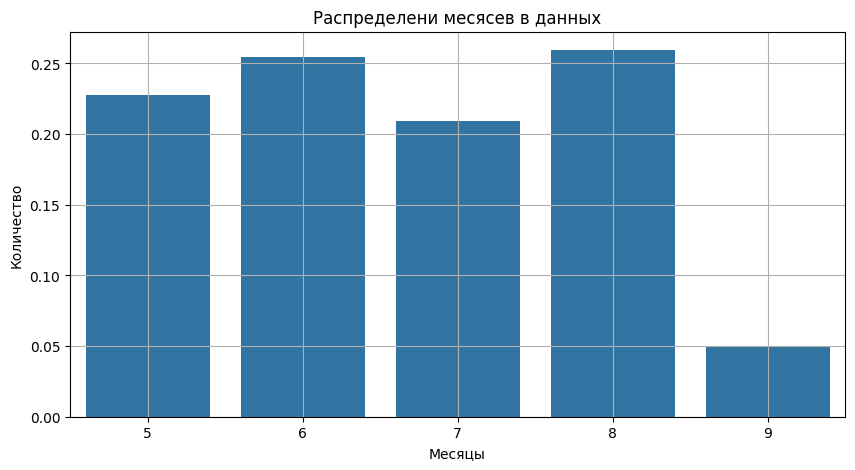

In [42]:
fig, ax = plt.subplots(figsize=(10,5)) 

df_month = df_arc['begin_heat'].dt.month.value_counts(normalize=True)

sns.barplot(x=df_month.index, y=df_month, ax=ax);

plt.grid()
plt.title('Распределени месясев в данных');
plt.xlabel('Месяцы');
plt.ylabel('Количество');

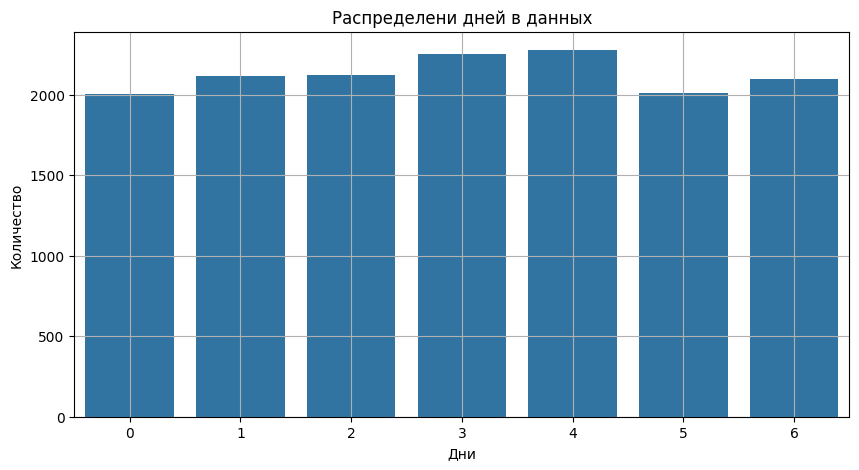

In [43]:
fig, ax = plt.subplots(figsize=(10,5)) 

df_days = df_arc['begin_heat'].dt.weekday.value_counts()

sns.barplot(x=df_days.index, y=df_days, ax=ax);

plt.grid()
plt.title('Распределени дней в данных');
plt.xlabel('Дни');
plt.ylabel('Количество');

Мы видим, что данные только за 2019 год. Их собирали с мая по сентябрь (вероятно, только в первую неделю сентября). Завод работает 24/24 и 7/7.

### Статистика данных

Чтобы оценить аномалии в столбцах begin_heat и end_heat, мы создаем признак 'warming_duration'.

In [44]:
# Создание признак измерения продолжительности активности электродов.
df_arc['warming_duration'] = (df_arc['end_heat']-df_arc['begin_heat']).dt.total_seconds()

In [45]:
# Выбор признаков для статистического анализа
num_col_arc = df_arc.drop('key', axis=1).select_dtypes(include=['int', 'float']).columns.to_list()
df_arc[num_col_arc].describe()

,active_power,reactive_power,warming_duration
count,14876.000000,14876.000000,14876.000000
mean,0.662752,0.438986,171.670946
std,0.258885,5.873485,98.186803
min,0.223120,-715.479924,11.000000
25%,0.467115,0.337175,107.000000
50%,0.599587,0.441639,147.000000
75%,0.830070,0.608201,214.000000
max,1.463773,1.270284,907.000000


Мы уже видим аномалию реактивной мощности.

Средняя активная мощность составляет 0,66 МВт, а большая часть активной мощности составляет менее 0,83 МВт.

Средняя реактивная мощность составляет около 0,49 МВАР, а большая часть реактивной мощности ниже 0,6. Это нормально, что реактивная мощность ниже активной мощности, так лучше, поскольку большая реактивная мощность может привести к большим потерям мощности.

Среднее время прогрева электрода составляет 171,67 секунды. В большинстве случаев эти электроды работают менее 3 минут, но мы видим, что иногда они работают дольше... здесь максимум - 15 минуты.

### Ящики с усами

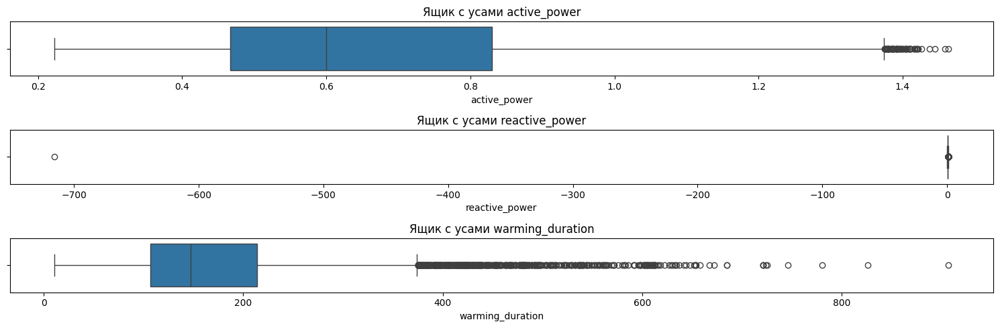

In [46]:
fig, axes = plt.subplots(nrows=len(num_col_arc), ncols=1, figsize=(15, 5))

axes = axes.flatten()

for i, column in enumerate(df_arc[num_col_arc].columns):
    
    sns.boxplot(data=df_arc, x=column, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {num_col_arc[i]}') 

plt.tight_layout()


plt.show()

У нас есть одна аномалия по реактивной мощности (минимум -715). У нас есть много выбросов для других столбцов, но это не аномалии. Давайте посмотрим на эту аномалию поближе.

In [47]:
df_arc.query('reactive_power < 0')

,key,begin_heat,end_heat,active_power,reactive_power,warming_duration
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,-715.479924,109.0


In [48]:
df_arc.query('0.705 < active_power <= 0.706')

,key,begin_heat,end_heat,active_power,reactive_power,warming_duration
279,59,2019-05-05 18:25:39,2019-05-05 18:27:46,0.705888,0.484497,127.0
506,110,2019-05-07 11:46:50,2019-05-07 11:49:07,0.705245,0.518153,137.0
603,131,2019-05-08 15:17:44,2019-05-08 15:21:20,0.705330,0.519067,216.0
1037,224,2019-05-12 01:49:55,2019-05-12 01:52:40,0.705840,0.485543,165.0
1122,242,2019-05-12 19:30:20,2019-05-12 19:34:34,0.705382,0.471932,254.0
1333,290,2019-05-14 18:01:13,2019-05-14 18:02:38,0.705640,0.477729,85.0
1532,330,2019-05-16 05:38:40,2019-05-16 05:41:01,0.705765,0.527374,141.0
1701,367,2019-05-17 20:16:16,2019-05-17 20:20:52,0.705329,0.540577,276.0
2061,443,2019-05-20 08:19:14,2019-05-20 08:20:37,0.705333,0.489200,83.0
2191,470,2019-05-21 10:46:44,2019-05-21 10:49:21,0.705627,0.494118,157.0


Похоже, что реальное значение может быть 0,479924 вместо -715,479924.

In [49]:
df_arc.query('key == 2116')

,key,begin_heat,end_heat,active_power,reactive_power,warming_duration
9778,2116,2019-07-28 02:07:12,2019-07-28 02:09:14,0.787549,0.693881,122.0
9779,2116,2019-07-28 02:13:10,2019-07-28 02:15:25,0.580263,0.411498,135.0
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,-715.479924,109.0
9781,2116,2019-07-28 02:29:11,2019-07-28 02:30:18,0.563641,0.408513,67.0


In [50]:
# Коррекция значения
df_arc.loc[9780, 'reactive_power'] = 0.479924

In [51]:
df_arc.query('key == 2116')

,key,begin_heat,end_heat,active_power,reactive_power,warming_duration
9778,2116,2019-07-28 02:07:12,2019-07-28 02:09:14,0.787549,0.693881,122.0
9779,2116,2019-07-28 02:13:10,2019-07-28 02:15:25,0.580263,0.411498,135.0
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,0.479924,109.0
9781,2116,2019-07-28 02:29:11,2019-07-28 02:30:18,0.563641,0.408513,67.0


### Feature engineering

Прежде чем мы начнем создавать признаки, мы должны напомнить, что такое активная мощность, а что такое реактивная мощность. Завод, вероятно, использует трехфазный ток. Таким образом, мы имеем

Активная мощность P — это реальная мощность, используемая и потребляемая цепью. Ее формула:

$$P = \sqrt(3) x V x I x \cos \theta $$ где V - напряжение, I - сила тока и $\theta$ это фаза

Реактивная мощность Q возникает в цепях переменного тока, когда напряжение и ток не совпадают по фазе. Это мощность, которая отражается обратно в сеть. Его формула:

$$Q = \sqrt(3) x V x I x \sin \theta $$ где V - напряжение, I - сила тока и $\theta$ это фаза

Из этого мы фактически можем получить полную мощность в ВА, S, то есть общую передаваемую мощность. Его формула:

$$S = \sqrt(P^2 + Q^2) = \sqrt(3) x V x I $$ где P — активная мощность, Q — реактивная мощность, V — напряжение, I — сила тока

Мы также можем получить коэффициент мощности, power factor, PF:

$$ PF = \frac{P}{S} = \cos \theta $$ где P — активная мощность, S — полная мощность, а $\theta$ — фаза

Если $\cos \theta$ равен 1, то ток синфазный и реактивная мощность не вырабатывается. Мы можем рассматривать этот фактор как коэффициент эффективности: чем он выше, тем лучше, потому что тогда генерируется больше реальную мощностю, меншее реактивны мощности, вызывают меньший износ и меньшую нагрузку на электросеть.

Мы также можем рассчитать энергию E, используемую электродами:

$$ E = P x t $$  где P — активная мощность и t — период времени, в течение которого электрод был активированы

#### Кажущаяся мощность

In [52]:
df_arc['apparent_power'] = (df_arc['active_power'].pow(2) + df_arc['reactive_power'].pow(2)).pow(0.5)

#### Энергия

In [53]:
df_arc['energy'] = df_arc['active_power']*df_arc['warming_duration']

#### Коэффициент мощности

In [54]:
df_arc['power_factor'] = df_arc['active_power']/df_arc['apparent_power']

#### Количество запуска нагрева электродами

In [55]:
# Создание словаря с номером активации по парти
dict_nb_activation = df_arc['key'].value_counts().to_dict()

In [56]:
dict_nb_activation[1]

5

In [57]:
# Создание нашей признака nb_activation
df_arc['nb_activations'] = df_arc['key'].map(dict_nb_activation)

### Распределенние признаков

#### Распределение активной мощности

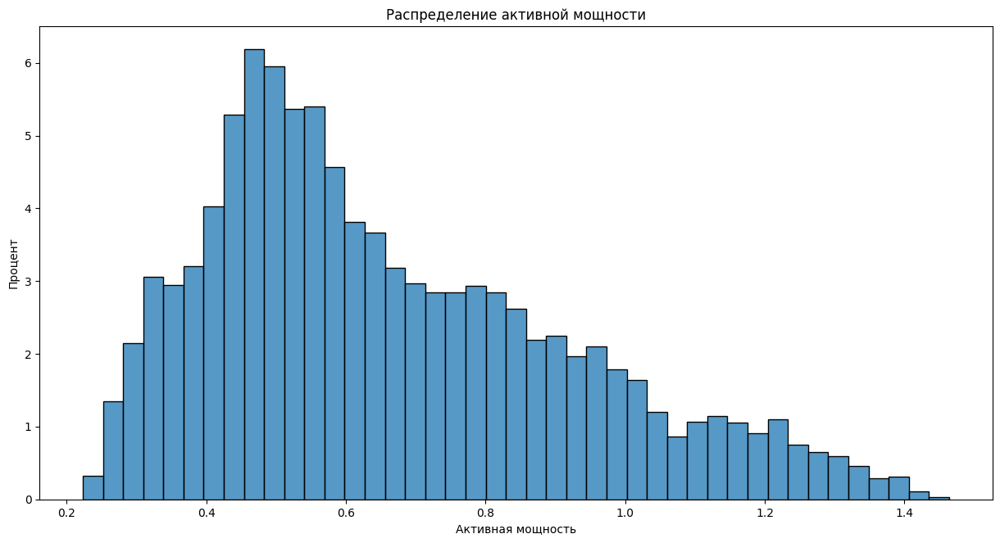

In [58]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='active_power', stat='percent');
plt.xlabel('Aктивная мощность');
plt.ylabel('Процент');
plt.title('Распределение активной мощности');

У нас есть распределение, близкое к распределению Пуассона, мы видим, что большая часть активации составляла 0,6 МВт или меньше.

#### Распределенние реактивной мощности

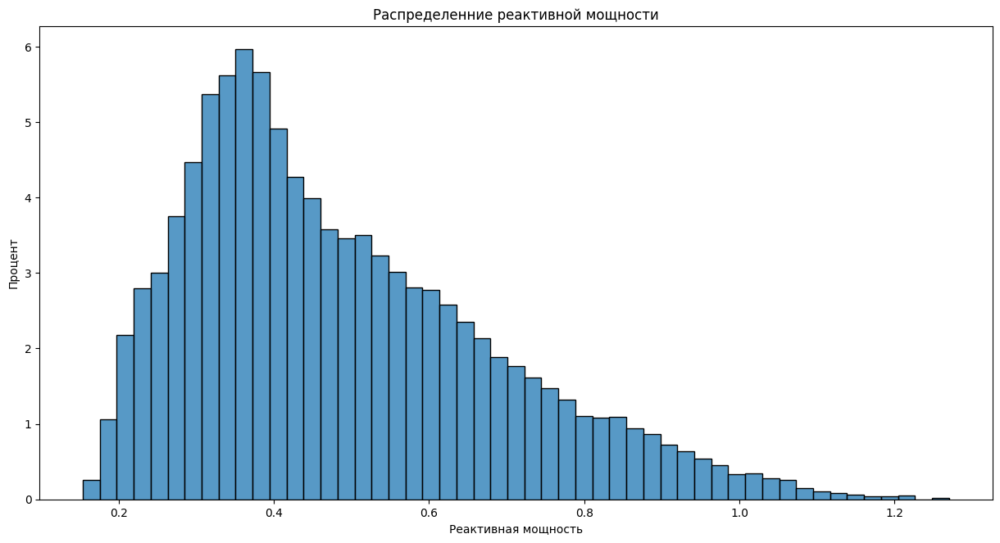

In [59]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='reactive_power', stat='percent');
plt.xlabel('Реактивная мощность');
plt.ylabel('Процент');
plt.title('Распределенние реактивной мощности');

Здесь мы также имеем распределение, близкое к распределению Пуассона, мы видим, что большая часть активации составляла 0,5 МВАР или меньше.

#### Распределенние полная мощность

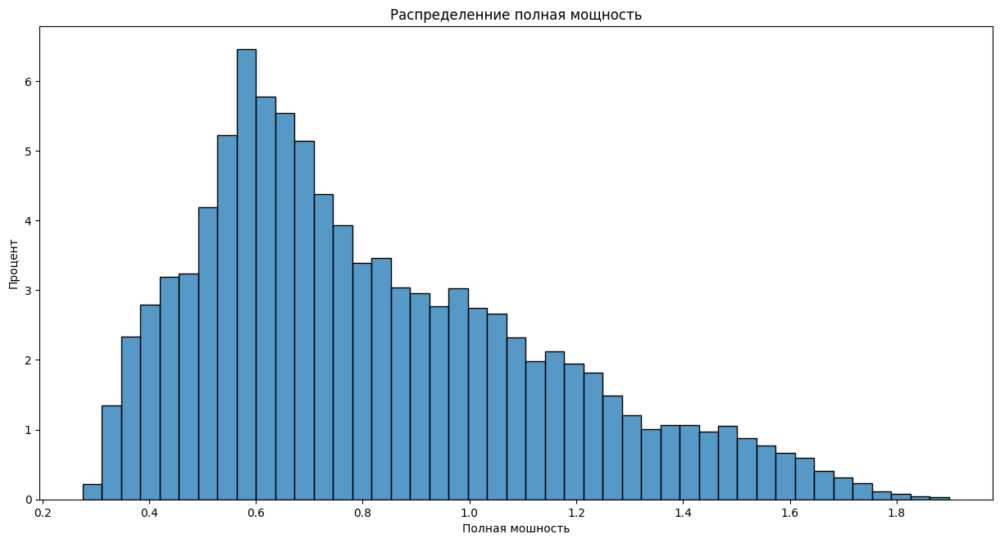

In [60]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='apparent_power', stat='percent');
plt.xlabel('Полная мошность');
plt.ylabel('Процент');
plt.title('Распределенние полная мощность');

Здесь мы также имеем распределение, близкое к распределению Пуассона: мы видим, что большая часть полной мощности составляла 0,8 МПа или меньше.

#### Распределение продолжительности нагрева

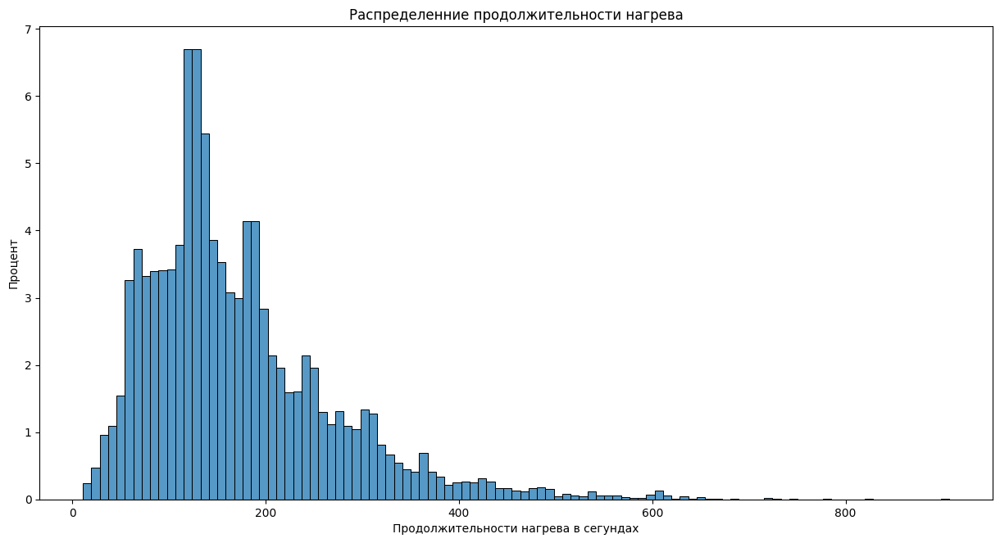

In [61]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='warming_duration', stat='percent');
plt.xlabel('Продолжительности нагрева в сегундах');
plt.ylabel('Процент');
plt.title('Распределенние продолжительности нагрева');

На графике мы ясно видим, что большая часть активации длилась 200 секунд или меньше.

#### Распределенние энергия

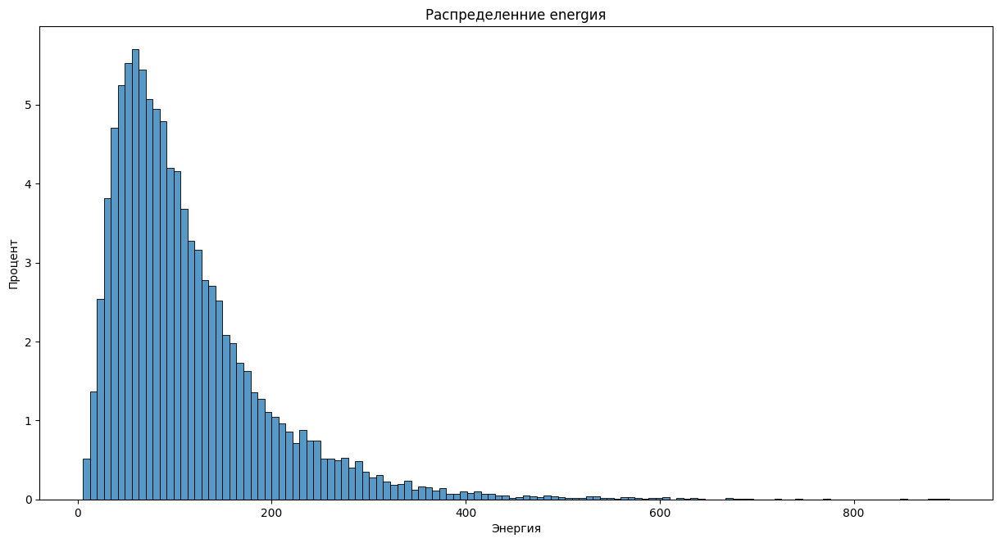

In [62]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='energy', stat='percent');
plt.xlabel('Энергия');
plt.ylabel('Процент');
plt.title('Распределенние energия');

Здесь мы явно имеем распределение Пуассона. Большая часть активации потребляет менее 0,05 МВт.

#### Распределенние коэффициента мощности

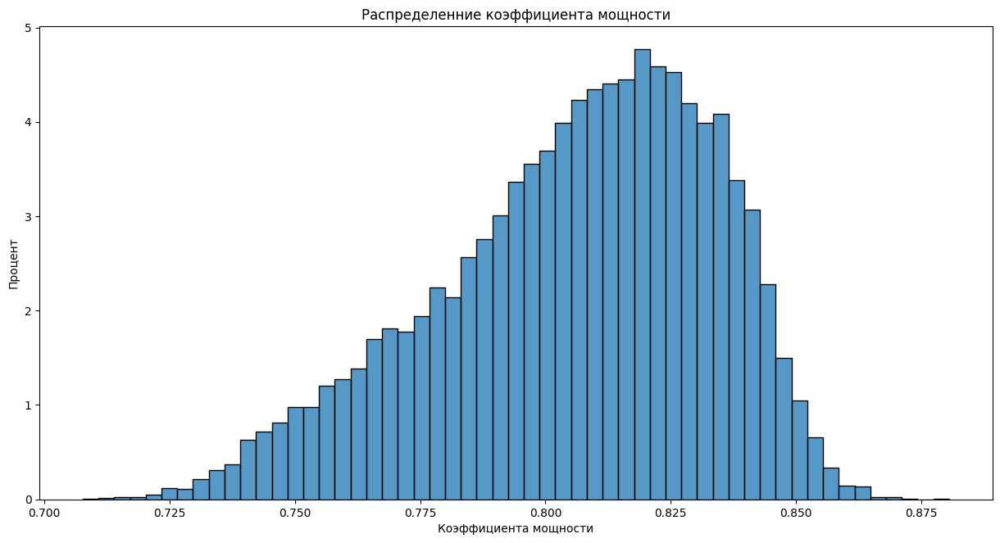

In [63]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='power_factor', stat='percent');
plt.xlabel('Коэффициента мощности');
plt.ylabel('Процент');
plt.title('Распределенние коэффициента мощности');

В большинстве случаев коэффициент мощности превышал 0,8, что является хорошим коэффициентом для компании. Это означает, что их электроустановка оптимизирована, у них нет больших потерь мощности из-за реактивной мощности.

#### Распределенние количество запуска

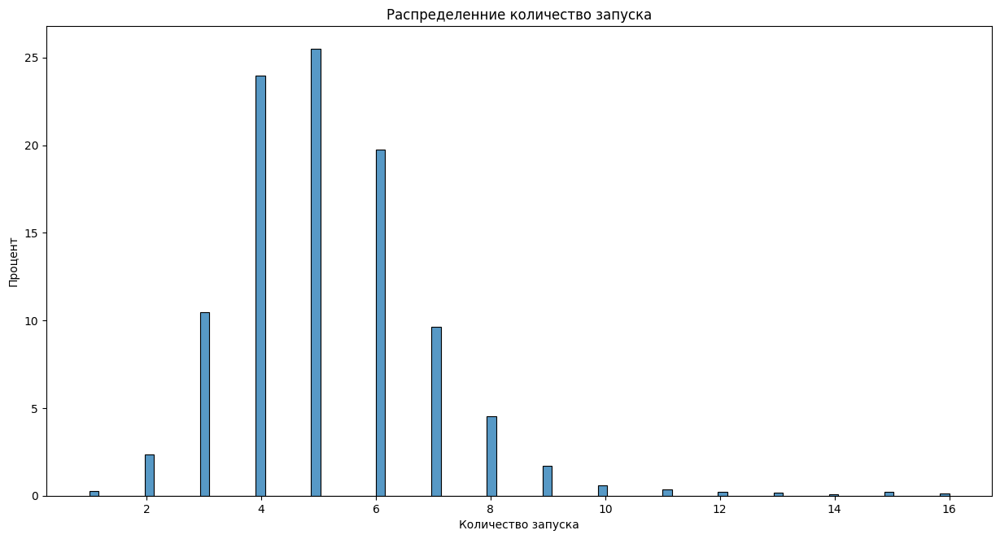

In [64]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_arc, x='nb_activations', stat='percent');
plt.xlabel('Количество запуска');
plt.ylabel('Процент');
plt.title('Распределенние количество запуска');

В большинстве случаев количество активаций было около 5, 4 или 6.

### Сводная таблица

Нам нужно агрегировать наш датафрейм. Изучив особенности, мы видим, что нам нужно использовать среднее значение для:
- активный, мощность
- реактивный мощность
- польная мощность
- коэффициент мощности
Потому что суммировать их не имеет смысла, поскольку физически электроды не дают такой большой мощности.

Однако, чтобы почувствовать длительность прогрева электрода, просуммируем:
- количество активации в парти
- продолжительность прогрева 
- энергия, потребляемая электродами

In [65]:
# Давайте удалим наши столбцы со значением в pandas datetime
df_arc_to_merge = df_arc.drop(['begin_heat', 'end_heat'], axis=1)

In [66]:
# Создаём нашу сводную таблицу
df_arc_arg = df_arc_to_merge.pivot_table(index='key', 
                                         aggfunc={'active_power':'mean', 
                                                  'reactive_power':'mean',
                                                  'apparent_power': 'mean',
                                                  'nb_activations':'mean',
                                                  'power_factor':'mean',
                                                  'warming_duration':'sum',
                                                  'energy':'sum'
                                                 })
df_arc_arg.reset_index(drop=False, inplace=True)

In [67]:
df_arc_arg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3214 entries, 0 to 3213
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   key               3214 non-null   int64  
 1   active_power      3214 non-null   float64
 2   apparent_power    3214 non-null   float64
 3   energy            3214 non-null   float64
 4   nb_activations    3214 non-null   float64
 5   power_factor      3214 non-null   float64
 6   reactive_power    3214 non-null   float64
 7   warming_duration  3214 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 201.0 KB


In [68]:
df_arc_arg.head()

,key,active_power,apparent_power,energy,nb_activations,power_factor,reactive_power,warming_duration
0,1,0.607346,0.743747,628.616930,5.0,0.816686,0.428564,1098.0
1,2,0.534852,0.647087,395.281800,4.0,0.825276,0.363339,811.0
2,3,0.812728,1.003845,581.774624,5.0,0.809724,0.587491,655.0
3,4,0.676622,0.850010,543.710274,4.0,0.793923,0.514248,741.0
4,5,0.563238,0.704245,412.180480,4.0,0.796818,0.421998,869.0


Мы получаем 3214 объектов (партий) для нашего сводны таблицы.

## Данные про сыпучих материалов

### Отработка данных

#### Обработка пропусков

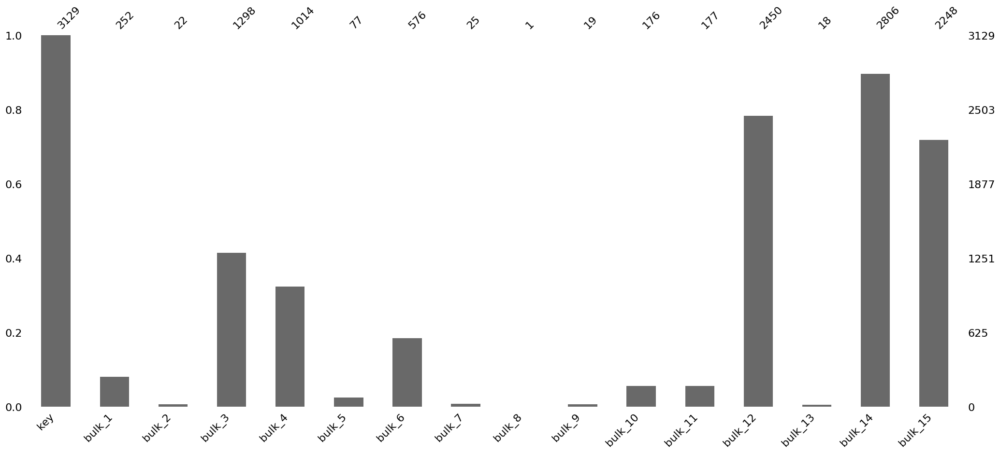

In [69]:
msno.bar(df_bulk);

Как мы видели ранее, существует множество фпризнаков с очень небольшим количеством непропущенных значений. В частности, bulk_1, bulk_2, bulk_5, bulk_7, bulk_8, bulk_9, bulk_10, bulk_11, bulk_13.

Здесь пропущенные значения означают, что материал из этих объектов не засыпали. Затем мы можем заменить пропусков значения на 0.

Однако, прежде чем заменять пропущенные значения, мы создадим признак для определения количества используемых сыпучих материалов. Эту операцию проще выполнить до замены пропущенных значений, поэтому мы делаем это сейчас.


In [70]:
# Создание признаки определения количества добавленых сыпучих матерялов для каждой партии
df_bulk['nb_powdered_materials'] = df_bulk.drop('key', axis=1).count(axis=1)

In [71]:
df_bulk.head(10)

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0,4
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0,4
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0,4
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0,4
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0,4
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0,4
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0,4
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0,4
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0,4
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0,3


In [72]:
# Замена пропущенных значений
df_bulk = df_bulk.fillna(0)

In [73]:
df_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   key                    3129 non-null   int64  
 1   bulk_1                 3129 non-null   float64
 2   bulk_2                 3129 non-null   float64
 3   bulk_3                 3129 non-null   float64
 4   bulk_4                 3129 non-null   float64
 5   bulk_5                 3129 non-null   float64
 6   bulk_6                 3129 non-null   float64
 7   bulk_7                 3129 non-null   float64
 8   bulk_8                 3129 non-null   float64
 9   bulk_9                 3129 non-null   float64
 10  bulk_10                3129 non-null   float64
 11  bulk_11                3129 non-null   float64
 12  bulk_12                3129 non-null   float64
 13  bulk_13                3129 non-null   float64
 14  bulk_14                3129 non-null   float64
 15  bulk

#### Дубликаты

In [74]:
print(f'Есть {df_bulk.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Статистика датасета

In [75]:
df_bulk.drop('key', axis=1).describe()

,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
count,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000
mean,3.160435,1.779163,47.240332,33.830617,2.633749,21.892298,2.441675,0.015660,0.463407,4.684564,4.345478,203.948226,1.041866,152.706616,115.319271,3.566315
std,11.869164,21.217878,74.239954,56.034505,20.918138,55.492582,31.944063,0.875978,6.154398,20.157323,22.699580,151.419639,14.114252,81.091421,84.488698,1.216165
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,105.000000,0.000000,104.000000,0.000000,3.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,0.000000,148.000000,106.000000,4.000000
75%,0.000000,0.000000,80.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,263.000000,0.000000,202.000000,204.000000,4.000000
max,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.000000,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000,7.000000


Мы уже видим, что основная часть — это Bulk_12, Bulk_14 и Bulk_15, потому что у них много значений, и эти значения высоки. Средний объем для:
- объем_12 равен 204, 
- объем_14 равен 153
- объем_15 равен 115

Являются ли эти основные компоненты марганца, никеля и хрома тремя основными компонентами стали?

#### Ящик с усами

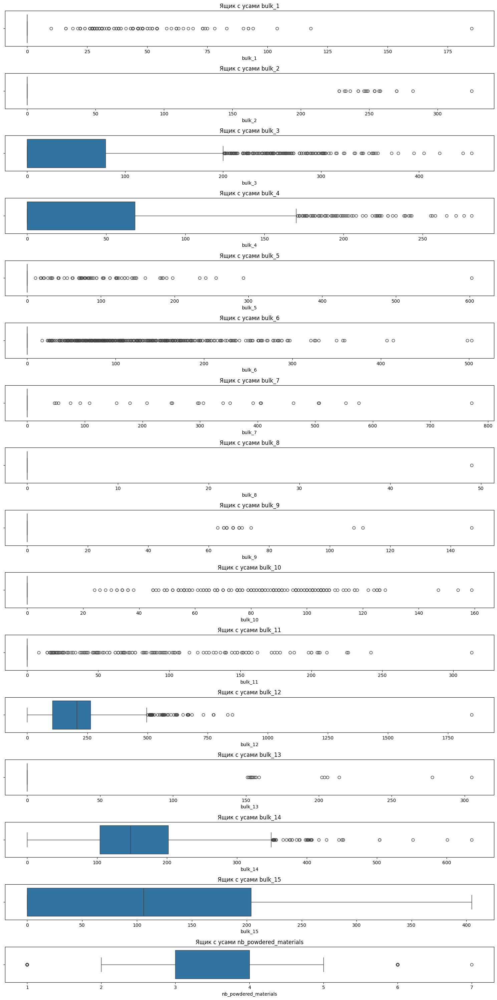

In [76]:
fig, axes = plt.subplots(nrows=16, ncols=1, figsize=(15, 30))

axes = axes.flatten()

columns_names = ['bulk_'+str(n) for n in range(1, 16)]+['nb_powdered_materials']
for i, col in enumerate(df_bulk.drop('key', axis=1)):
    
    sns.boxplot(data=df_bulk, x=col, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {columns_names[i]}') 

plt.tight_layout()


plt.show()

Мы заметили много выбросов во всех признаках, кроме bulk_15. 
Для больших объемов данных с небольшим количеством значений нам нужно быть осторожными, поскольку средние значения невелики, а значения очень разбросаны. 
На самом деле мы не замечаем аномалий, но замечаем «далекие выбросы», для групп bulk_1, bulk_2, bulk_5, bulk_6, bulk_7, bulk_11, bulk_12, bulk_13 и bulk_14. Мы можем увидеть их ниже для каждой функции:

In [77]:
df_bulk.query('bulk_1 > 125')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
303,322,185.0,0.0,101.0,58.0,0.0,0.0,406.0,0.0,0.0,0.0,0.0,1849.0,0.0,636.0,0.0,6


In [78]:
df_bulk.query('bulk_2 > 300')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
104,117,52.0,325.0,0.0,68.0,112.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4


In [79]:
df_bulk.query('bulk_5 > 600')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
1747,1808,0.0,0.0,226.0,30.0,603.0,0.0,0.0,0.0,0.0,0.0,0.0,210.0,0.0,99.0,104.0,6


In [80]:
df_bulk.query('bulk_6 > 480')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
1219,1269,0.0,0.0,163.0,0.0,0.0,503.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,304.0,203.0,4
2535,2633,0.0,0.0,250.0,0.0,0.0,498.0,0.0,0.0,0.0,0.0,0.0,58.0,0.0,194.0,108.0,5


In [81]:
df_bulk.query('bulk_9 > 140')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
1725,1786,0.0,0.0,123.0,0.0,0.0,0.0,0.0,49.0,147.0,0.0,0.0,0.0,0.0,0.0,0.0,3


In [82]:
df_bulk.query('bulk_11 > 300')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
961,1006,0.0,0.0,0.0,0.0,0.0,38.0,0.0,0.0,0.0,0.0,313.0,460.0,0.0,203.0,207.0,5


In [83]:
df_bulk.query('bulk_12 > 1750')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
303,322,185.0,0.0,101.0,58.0,0.0,0.0,406.0,0.0,0.0,0.0,0.0,1849.0,0.0,636.0,0.0,6


In [84]:
df_bulk.query('bulk_13 > 270')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
188,204,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,416.0,278.0,0.0,158.0,4
1629,1689,0.0,0.0,0.0,0.0,0.0,247.0,0.0,0.0,0.0,0.0,0.0,733.0,305.0,248.0,224.0,5


In [85]:
df_bulk.query('bulk_14 > 600')

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,nb_powdered_materials
303,322,185.0,0.0,101.0,58.0,0.0,0.0,406.0,0.0,0.0,0.0,0.0,1849.0,0.0,636.0,0.0,6
1774,1836,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,601.0,103.0,3


Все эти «дальние выбросы» происходят для разных номеров парти, за исключением индекса 303.
Индекс 303 содержит 3 «сильных выброса», может быть, мы можем рассматривать их как аномалии? Вероятно, нам нужно удалить этот индекс и связанную с ним партию. Для остальных «далеко отстающих» мы пока ничего делать не будем. Посмотрим после объединения всех таблиц.

In [86]:
df_arc.query('key == 322')

,key,begin_heat,end_heat,active_power,reactive_power,warming_duration,apparent_power,energy,power_factor,nb_activations
1487,322,2019-05-15 21:12:28,2019-05-15 21:14:57,0.248241,0.187737,149.0,0.311237,36.987909,0.797594,13
1488,322,2019-05-15 21:17:00,2019-05-15 21:21:04,0.464677,0.346769,244.0,0.579805,113.381188,0.801437,13
1489,322,2019-05-15 21:26:09,2019-05-15 21:31:26,0.328053,0.279597,317.0,0.431037,103.992801,0.761078,13
1490,322,2019-05-15 21:40:12,2019-05-15 21:41:43,1.054529,0.814842,91.0,1.332666,95.962139,0.791293,13
1491,322,2019-05-15 21:46:57,2019-05-15 21:49:02,0.746207,0.556786,125.0,0.931040,93.275875,0.801477,13
1492,322,2019-05-15 21:51:58,2019-05-15 21:57:28,0.623596,0.461261,330.0,0.775650,205.786680,0.803965,13
1493,322,2019-05-15 22:02:54,2019-05-15 22:04:42,0.893317,0.619611,108.0,1.087167,96.478236,0.821692,13
1494,322,2019-05-15 22:08:33,2019-05-15 22:11:40,1.107495,0.823706,187.0,1.380231,207.101565,0.802398,13
1495,322,2019-05-15 22:14:27,2019-05-15 22:16:19,0.870899,0.685100,112.0,1.108074,97.540688,0.785958,13
1496,322,2019-05-15 22:40:56,2019-05-15 22:42:40,0.612125,0.441813,104.0,0.754914,63.661000,0.810854,13


Для этого процесса (партии 322) требуется много активаций, и для этой парти он длился очень долго, менее 2 часов. Большая часть процесса длится 50-70 минут.
Так что, вероятно, это не аномалия, однако нам, вероятно, придется избавиться от этой вечеринки позже, потому что позже мы оценим продолжительность каждой вечеринки и удалим выбросы, которые могут повлиять на нашу модель неправильным образом.

### Распределение признаков

#### Распределерие добавлыних сыпучих матерялов

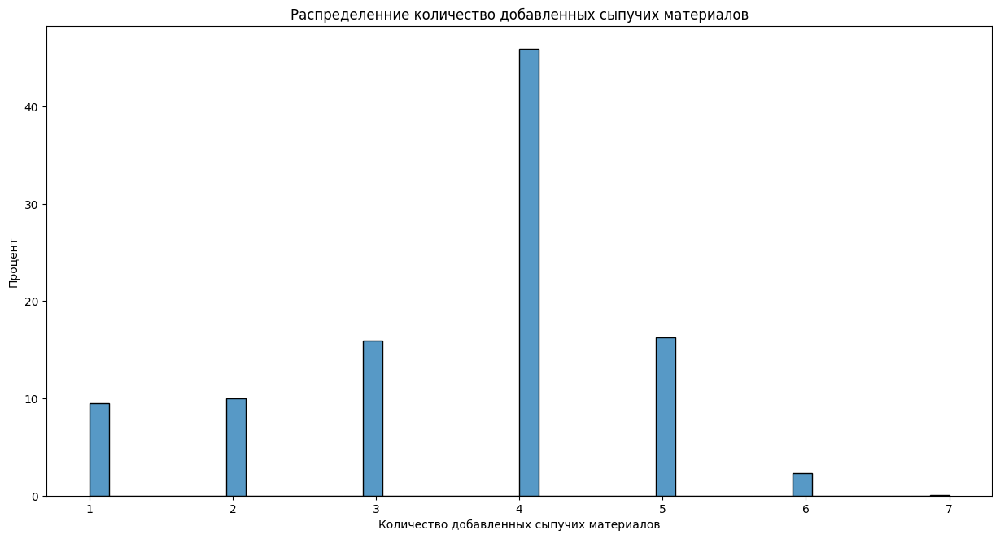

In [87]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_bulk, x='nb_powdered_materials', stat='percent')
plt.xlabel('Количество добавленных сыпучих материалов');
plt.ylabel('Процент');
plt.title('Распределенние количество добавленных сыпучих материалов');

Мы видим, что большую часть времени используются 4 разных сыпучих материалов.

#### Распределение сыпучих матерялов

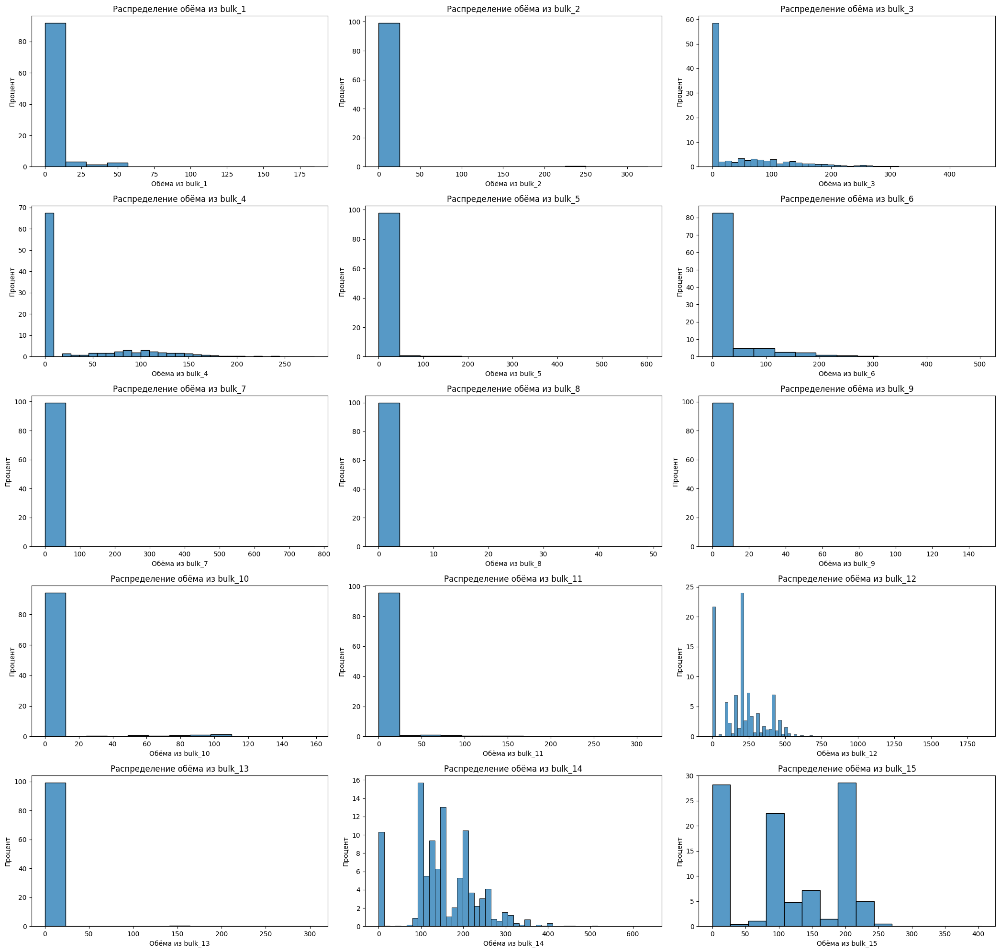

In [88]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(21, 20))

axes = axes.flatten()

columns_names = ['bulk_'+str(n) for n in range(1, 16)]
for i, col in enumerate(df_bulk.drop(['key', 'nb_powdered_materials'], axis=1)):
    
    sns.histplot(data=df_bulk, x=col, stat='percent', ax=axes[i]) 
    
    axes[i].set_title(f'Распределение обёма из {columns_names[i]}') 
    axes[i].set_xlabel(f'Обёма из {columns_names[i]}')
    axes[i].set_ylabel(f'Процент')

plt.tight_layout()


plt.show()

Мы видим здесь то же, что видели ранее. Значения с низким количеством значений, как правило, имеют узкое распределение, но для основной группы, Bulk_12, Bulk_14 и Bulk_15 распределение значений более неравномерное.

## Данные про времени добавки сыпучих материалов

### Feature engineering

#### Создание времени добавка для каждого материала

Ранее мы видели, что наши признаки в этом датафрейме были выражены как pandas datetime. Однако в нашем случае мы не можем работать с datetime. Затем я решил создать введенное время в секундах, которое больше похоже на продолжительность, используя эталонное время. Так мы можем:
- хронологически упорядоченный ввод различных материалов
- используя одно и то же эталонное время, мы сможем в одном масштабе провести добавление сыпучных материалов и проволочных материалов. Например, в первой части мы видели, что проволочна материала wire 1 была введена в то же время, что bulk 4. При использовании того же базового времени эти значения будут одинаковыми.

Мы знаем, что можем проверить наличие аномалий в интервале между впрысками различных материалов, не обращаясь к другому датафрейму. Однако, поскольку я все равно собираюсь создать новый признак, я бы предпочел проверить наличие аномалий с помощью нового признак. Это нам позволит:
- проверьте интервал между добавленями матерялов
- проверка аномалий с другим процессом от той же парти

Создав новый признак, мы можем легко работать с пропусками.

#### Создание эталонного времени

Ранее мы видели, что первое время измерения было из df_temp, где измерялась температура. Тогда мы будем использовать время первого измерения каждой стороны из df_temp в качестве эталонного времени.

In [89]:
# Создание сводной таблицы для получения всего минимального времени для каждой парти
df_temp_min_time = df_temp.pivot_table(index='key', values='measure_time', aggfunc='min')
df_temp_min_time.head(5)

,measure_time
key,
1,2019-05-03 11:02:04
2,2019-05-03 11:34:04
3,2019-05-03 12:06:44
4,2019-05-03 12:39:27
5,2019-05-03 13:11:03


In [90]:
df_temp.head(15)

,key,measure_time,temperature
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0
5,1,2019-05-03 11:30:38,1613.0
6,2,2019-05-03 11:34:04,1581.0
7,2,2019-05-03 11:38:40,1577.0
8,2,2019-05-03 11:46:09,1589.0
9,2,2019-05-03 11:49:38,1604.0


Мы видим, что сводная таблица собирает все первое измеренное время.

In [91]:
# Создание словаря из сводной таблицы
dict_min_temp = df_temp_min_time.to_dict()

In [92]:
#Проверяем словарь
dict_min_temp['measure_time'][1]

Timestamp('2019-05-03 11:02:04')

In [93]:
# Создаём наш столбец ref_time, содержащий всё первое измеренное время для каждой парти
df_bulk_time['ref_time'] = df_bulk_time['key'].map(dict_min_temp['measure_time'])

In [94]:
df_bulk_time.head()

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,ref_time
0,1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:24:31,NaT,2019-05-03 11:14:50,2019-05-03 11:10:43,2019-05-03 11:02:04
1,2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:53:30,NaT,2019-05-03 11:48:37,2019-05-03 11:44:39,2019-05-03 11:34:04
2,3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:27:13,NaT,2019-05-03 12:21:01,2019-05-03 12:16:16,2019-05-03 12:06:44
3,4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:58:00,NaT,2019-05-03 12:51:11,2019-05-03 12:46:36,2019-05-03 12:39:27
4,5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,2019-05-03 13:34:12,2019-05-03 13:30:47,2019-05-03 13:11:03


#### Создание признаков разницы между ref_time и времени выпуска для каждого материала в секундах 

In [95]:
# Изменение названия функций, чтобы не смешивать их с именами признаков из df_bulk
for col in range(1, 16):
    df_bulk_time['bulk_'+str(col)+'_dt'] = (df_bulk_time['bulk_'+str(col)] - df_bulk_time['ref_time'])\
                                                                                            .dt.total_seconds()

In [96]:
df_bulk_time.head()

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,...,bulk_6_dt,bulk_7_dt,bulk_8_dt,bulk_9_dt,bulk_10_dt,bulk_11_dt,bulk_12_dt,bulk_13_dt,bulk_14_dt,bulk_15_dt
0,1,NaT,NaT,NaT,2019-05-03 11:28:48,NaT,NaT,NaT,NaT,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,1347.0,NaN,766.0,519.0
1,2,NaT,NaT,NaT,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,1166.0,NaN,873.0,635.0
2,3,NaT,NaT,NaT,2019-05-03 12:32:39,NaT,NaT,NaT,NaT,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,1229.0,NaN,857.0,572.0
3,4,NaT,NaT,NaT,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,1113.0,NaN,704.0,429.0
4,5,NaT,NaT,NaT,2019-05-03 13:30:47,NaT,NaT,NaT,NaT,NaT,...,NaN,NaN,NaN,NaN,NaN,NaN,1184.0,NaN,1389.0,1184.0


In [97]:
df_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 32 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   key         3129 non-null   int64         
 1   bulk_1      252 non-null    datetime64[ns]
 2   bulk_2      22 non-null     datetime64[ns]
 3   bulk_3      1298 non-null   datetime64[ns]
 4   bulk_4      1014 non-null   datetime64[ns]
 5   bulk_5      77 non-null     datetime64[ns]
 6   bulk_6      576 non-null    datetime64[ns]
 7   bulk_7      25 non-null     datetime64[ns]
 8   bulk_8      1 non-null      datetime64[ns]
 9   bulk_9      19 non-null     datetime64[ns]
 10  bulk_10     176 non-null    datetime64[ns]
 11  bulk_11     177 non-null    datetime64[ns]
 12  bulk_12     2450 non-null   datetime64[ns]
 13  bulk_13     18 non-null     datetime64[ns]
 14  bulk_14     2806 non-null   datetime64[ns]
 15  bulk_15     2248 non-null   datetime64[ns]
 16  ref_time    3129 non-nul

In [98]:
# Создание нового  датафреймы с нашими новыми признаками
df_bulk_dt = df_bulk_time.select_dtypes(exclude='datetime64')

### Отработка данных

#### Обработка пропусков

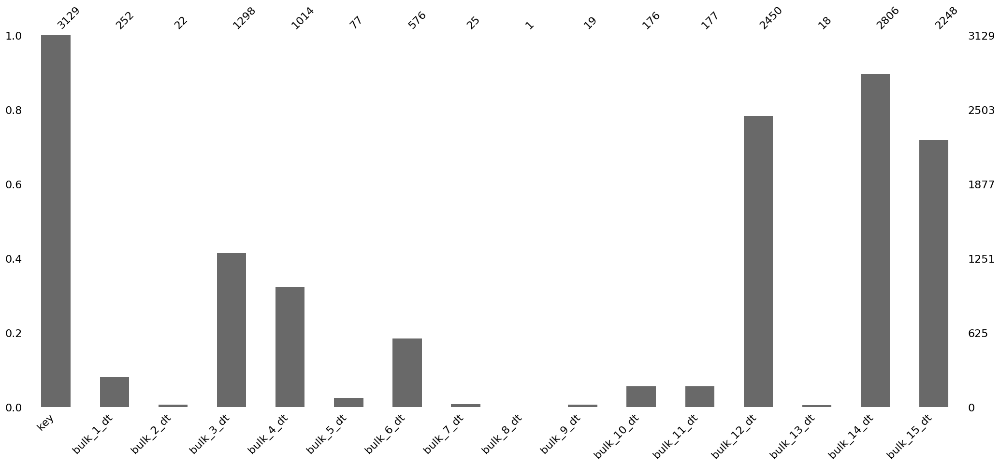

In [99]:
msno.bar(df_bulk_dt);

Как в df_bulk, отсутствие значений здесь означает, что материал определенного типа не был введен. Затем мы можем заменить эти значения на 0.

In [100]:
# Замена пропущенных значений
df_bulk_dt = df_bulk_dt.fillna(0)

In [101]:
df_bulk_dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   key         3129 non-null   int64  
 1   bulk_1_dt   3129 non-null   float64
 2   bulk_2_dt   3129 non-null   float64
 3   bulk_3_dt   3129 non-null   float64
 4   bulk_4_dt   3129 non-null   float64
 5   bulk_5_dt   3129 non-null   float64
 6   bulk_6_dt   3129 non-null   float64
 7   bulk_7_dt   3129 non-null   float64
 8   bulk_8_dt   3129 non-null   float64
 9   bulk_9_dt   3129 non-null   float64
 10  bulk_10_dt  3129 non-null   float64
 11  bulk_11_dt  3129 non-null   float64
 12  bulk_12_dt  3129 non-null   float64
 13  bulk_13_dt  3129 non-null   float64
 14  bulk_14_dt  3129 non-null   float64
 15  bulk_15_dt  3129 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.3 KB


#### Дубликаты

In [102]:
print(f'Есть {df_bulk_dt.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Статистика датафреймы

In [103]:
df_bulk_dt.drop('key', axis=1).describe()

,bulk_1_dt,bulk_2_dt,bulk_3_dt,bulk_4_dt,bulk_5_dt,bulk_6_dt,bulk_7_dt,bulk_8_dt,bulk_9_dt,bulk_10_dt,bulk_11_dt,bulk_12_dt,bulk_13_dt,bulk_14_dt,bulk_15_dt
count,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000
mean,158.947267,34.800256,683.891019,542.262384,61.660594,349.880473,23.981783,0.390540,9.584532,91.587089,94.659636,1335.450943,25.445510,1307.529882,780.685842
std,778.340122,548.669384,1200.018312,1098.402884,547.994485,1085.093288,396.812015,21.845824,138.719820,464.386253,509.188616,1281.278860,549.312147,1028.107032,927.518019
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,187.000000,0.000000,857.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1347.000000,0.000000,1209.000000,697.000000
75%,0.000000,0.000000,1230.000000,730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1914.000000,0.000000,1652.000000,1083.000000
max,21192.000000,20622.000000,19327.000000,17540.000000,17291.000000,23510.000000,16712.000000,1222.000000,3074.000000,7688.000000,11967.000000,23117.000000,22410.000000,22055.000000,21763.000000


Что касается основных материалов, мы видим, что:
- для Bulk_12:
    - среднее время добавка составляет 1335 секунд после начала процесса
    - 25% добавки делается через 4 минуты после начала процесса
- для Bulk_14:
    - среднее время добавка составляет 1308 секунд после начала процесса
    - 25% добавки делается через 15 минут после начала процесса
- для Bulk_15:
    - среднее время добавка составляет 781 секунда после начала процесса
    - 50% добавки делается через 12 минут после начала процесса

#### Ящик с усами

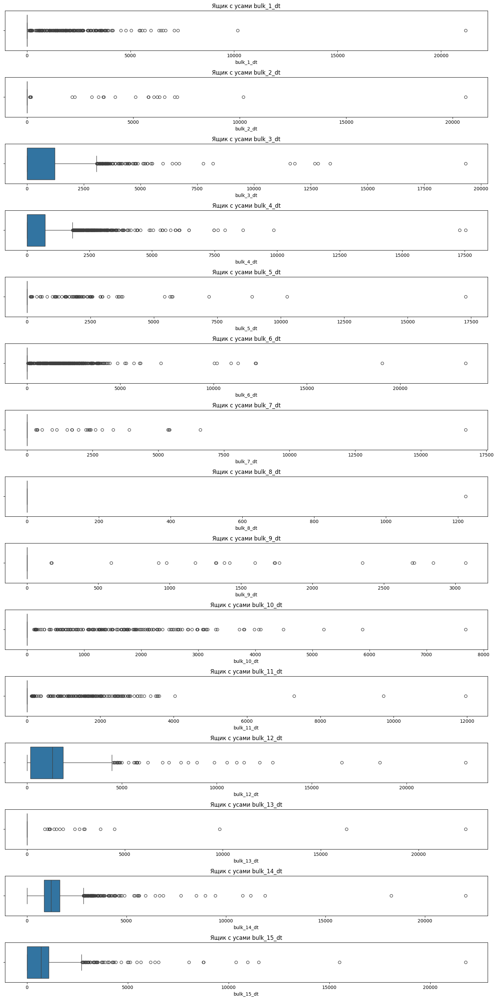

In [104]:
fig, axes = plt.subplots(nrows=15, ncols=1, figsize=(15, 30))

axes = axes.flatten()

columns_names = ['bulk_'+str(n)+'_dt' for n in range(1, 16)]
for i, col in enumerate(df_bulk_dt.drop('key', axis=1)):
    
    sns.boxplot(data=df_bulk_dt, x=col, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {columns_names[i]}') 

plt.tight_layout()


plt.show()

Как мы видели ранее, у нас есть некоторые «далние выбросы», когда процесс ковшового рафинирования занимал очень много времени, но никаких аномалий не было, поскольку ни одно из основных процессов не превышало 6 часов. Мы более подробно рассмотрим эти очень длительные процессы позже в отчете.

###  Распределение время добавки  сыпучих матерялов

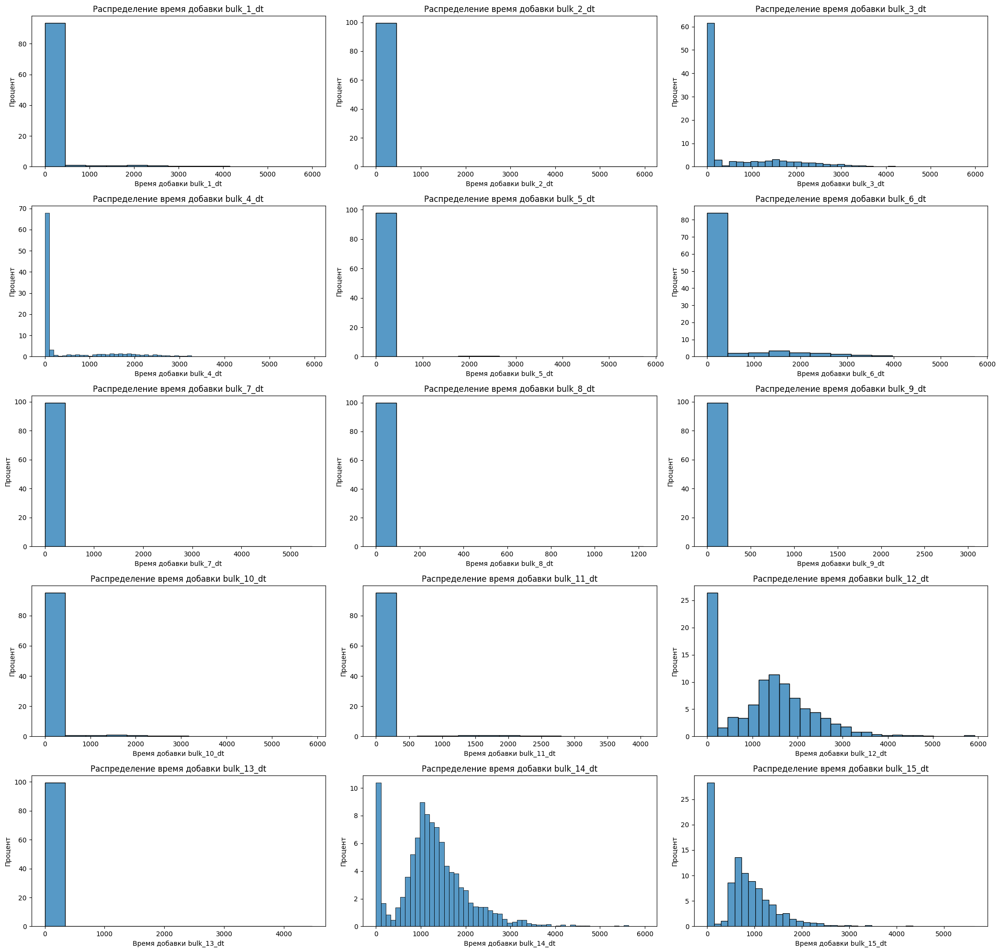

In [105]:
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(21, 20))

axes = axes.flatten()

columns_names = ['bulk_'+str(n)+'_dt' for n in range(1, 16)]
for i, col in enumerate(df_bulk_dt.drop('key', axis=1)):
    
    sns.histplot(data=df_bulk_dt[df_bulk_dt[col]<6000], x=col, stat='percent', ax=axes[i]) 
    
    axes[i].set_title(f'Распределение время добавки {columns_names[i]}') 
    axes[i].set_xlabel(f'Время добавки {columns_names[i]}')
    axes[i].set_ylabel(f'Процент')

plt.tight_layout()


plt.show()

У нас такое же распределение, как и у датафрейма данных с массовым расширением для Bulk_12_dt, Bulk_14_dt и Bulk_15_dt. Видим, что для Bulk_12 большая часть добавки происходит через 1800 секунд после начала процесса, для Bulk_14 большая часть впрыска материала происходит через 1500 секунд после начала процесса. Для Bulk_15 мы видим, что большую часть времени он внедряется через 1000 секунд после начала процесса.

## Данные про газы

### Отработка данных

Как мы видели ранее, в первой части в этом датафрейме нет пропущенных значений.

#### Дюбликаты

In [106]:
print(f'Есть {df_gas.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Статистика датафреймы

In [107]:
df_gas.drop('key', axis=1).describe()

,gas
count,3239.000000
mean,11.002062
std,6.220327
min,0.008399
25%,7.043089
50%,9.836267
75%,13.769915
max,77.995040


Средний объем закачки газа — 11, а 75% закачки содержат меньше 14. Однако у нас максимум — 78. Это выглядит как аномалия.

#### Ящик с усами

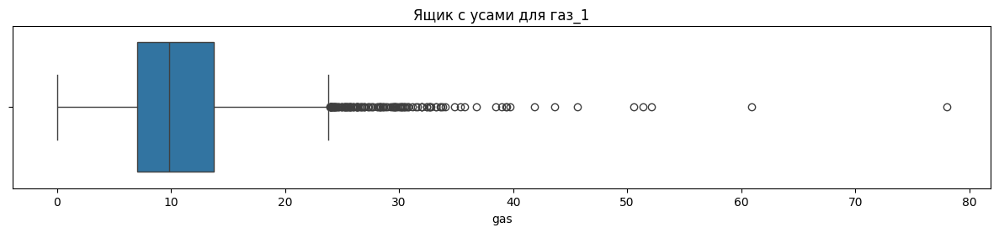

In [108]:
plt.figure(figsize=(15, 2.5))
sns.boxplot(data=df_gas, x='gas') 
    
plt.title(f'Ящик с усами для газ_1');

На диаграмме мы видим, что у нас есть выбросы и потенциально аномалия около 80.

In [109]:
df_gas.query('gas > 70')

,key,gas
319,322,77.99504


Эта аномалия опять-таки принадлежит партии № 322, где мы располагаем очень большим объемом материала. Возможно, это не аномалия, просто при этом процессе используется много материала и газа. Но, как я уже говорил ранее, с партией 322 мы разберемся позже. 
Что касается других «далеких выбросов», мы также рассмотрим их позже, после объединение датафреймов.

### Распределенние добавки газа

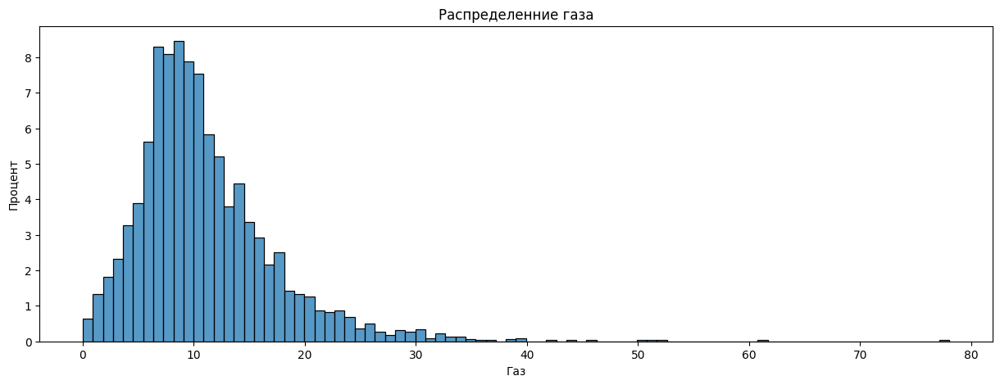

In [110]:
plt.figure(figsize=(15, 5))
sns.histplot(data=df_gas, x='gas', stat='percent');
plt.xlabel('Газ');
plt.ylabel('Процент');
plt.title('Распределенние газа');

Распределение отдаленно напоминает нормальное распределение с центром в 10.

## Данные про температуры

Поскольку нам просто нужна температура из времени первого измерения и времени последнего измерения для каждой парти, эта другая промежуточная температура будет считаться утечкой данных и нам придется удалить строку с отсутствующими значениями, было бы лучше создать еще один датафрейм для температуры, избегая измерения промежуточной температуры и пропущенных значений.

In [111]:
#Давайте удалим первы датафрейм с температурами
del df_temp

#### Создание нового датафрейм по температуре

In [112]:
# Наш новый запрос, выбирающий только первую и последнюю измеренные температуры без учета пропущенных значений

query_temp_new = '''

    WITH t_min AS (
                SELECT DISTINCT key, 
                MIN(`Время замера`) OVER(PARTITION BY key) AS initial_measure_time
                FROM data_temp
                ),
    t_min_2 AS (SELECT t_min.key,
                        initial_measure_time,
                       CAST(`Температура` AS NUMERIC) AS initial_temperature
                FROM t_min
                JOIN data_temp AS dt ON t_min.initial_measure_time = dt.`Время замера`
                WHERE `Температура` IS NOT NULL
    
    ),
    t_max AS (
                SELECT DISTINCT key, 
                MAX(`Время замера`) OVER(PARTITION BY key) AS final_measure_time
                FROM data_temp
                ),
    t_max_2 AS (SELECT t_max.key,
                       final_measure_time,
                       CAST(`Температура` AS NUMERIC) AS target
                FROM t_max
                JOIN data_temp AS dt ON t_max.final_measure_time = dt.`Время замера`
                WHERE `Температура` IS NOT NULL
    
    )
    SELECT t_min_2.key,
           initial_measure_time,
           initial_temperature,
           final_measure_time,
           target
    FROM t_min_2
    JOIN t_max_2 ON t_min_2.key = t_max_2.key

'''

In [113]:
# Наш новый датафрейм для температуры
df_temp_new = pd.read_sql_query(query_temp_new, con=engine, parse_dates=['initial_measure_time', 
                                                                                 'final_measure_time'])

In [114]:
df_temp_new.head()

,key,initial_measure_time,initial_temperature,final_measure_time,target
0,1,2019-05-03 11:02:04,1571,2019-05-03 11:30:38,1613
1,2,2019-05-03 11:34:04,1581,2019-05-03 11:55:09,1602
2,3,2019-05-03 12:06:44,1596,2019-05-03 12:35:57,1599
3,4,2019-05-03 12:39:27,1601,2019-05-03 12:59:47,1625
4,5,2019-05-03 13:11:03,1576,2019-05-03 13:36:39,1602


In [115]:
df_temp_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2477 entries, 0 to 2476
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   2477 non-null   int64         
 1   initial_measure_time  2477 non-null   datetime64[ns]
 2   initial_temperature   2477 non-null   int64         
 3   final_measure_time    2477 non-null   datetime64[ns]
 4   target                2477 non-null   int64         
dtypes: datetime64[ns](2), int64(3)
memory usage: 96.9 KB


Мы создали еще один датафрейм с начальным временем измерения и температурой, а также с конечным временем измерения и целью. Мы также избегаем пропущенных значений в запросе.
Этот новый датафрейм содержит 2477 объектов (партия).

#### Создание продолжительности партия

Давайте создадим еще один признак с продолжительностью процесса. Для этого мы берем время из таблицы температур, поскольку оно наиболее близко к началу и концу процесса.

In [116]:
df_temp_new['party_duration'] = (df_temp_new['final_measure_time'] - df_temp_new['initial_measure_time'])\
                                                                                            .dt.total_seconds()
                                

In [117]:
# Let's remove the feature using pandas datetime
df_temp_new = df_temp_new.drop(['final_measure_time', 'initial_measure_time'], axis=1)

#### Создание функции абсолютная разница температуры

Эта переменая предназначена только для изучения температуры и не будет использоваться для модели. Поскольку мы увидели, что небольшое изменение температуры может существенно повлиять на конечный продукт, мы просто хотим понять, насколько мал температурный разрыв между начальной и конечной температурой процесса.
Мы будем удалить этот столбец после его изучении.

In [118]:
df_temp_new['absolute_diff_temp'] = (np.abs(df_temp_new['target']-df_temp_new['initial_temperature']))/\
                                                                        df_temp_new['initial_temperature']*100

### Отработка данных

#### Отработка пропусков

Мы избавились от пропущенных значений во время создания нового датафреймы.

#### Дюбликаты

In [119]:
print(f'Есть {df_temp_new.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Аномали на температуре

Было сказано, что температуры ниже 1500 °C можно считать аномалиями.

In [120]:
df_temp_new.query('initial_temperature < 1500 or target < 1500')

,key,initial_temperature,target,party_duration,absolute_diff_temp
855,867,1191,1599,2684.0,34.256927
1201,1214,1208,1591,2573.0,31.705298
1604,1619,1218,1590,558.0,30.541872
2036,2052,1227,1592,2268.0,29.747351


Есть 4 партие, где температура ниже 1500°С. Мы их удалим, так как понятия не имеем, чем заменить эти значения, не исказив данные.

In [121]:
df_temp_new = df_temp_new.drop([855, 1201, 1604, 2036], axis=0)

In [122]:
df_temp_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2473 entries, 0 to 2476
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   key                  2473 non-null   int64  
 1   initial_temperature  2473 non-null   int64  
 2   target               2473 non-null   int64  
 3   party_duration       2473 non-null   float64
 4   absolute_diff_temp   2473 non-null   float64
dtypes: float64(2), int64(3)
memory usage: 115.9 KB


#### Статистика датафреймы

In [123]:
df_temp_new.drop('key', axis=1).describe()

,initial_temperature,target,party_duration,absolute_diff_temp
count,2473.000000,2473.000000,2473.000000,2473.000000
mean,1589.016175,1595.338051,2279.472705,1.195803
std,24.996127,16.031388,1375.318051,0.921127
min,1519.000000,1541.000000,0.000000,0.000000
25%,1572.000000,1587.000000,1541.000000,0.444162
50%,1588.000000,1593.000000,2007.000000,1.021059
75%,1605.000000,1599.000000,2739.000000,1.697046
max,1679.000000,1700.000000,23674.000000,6.599623


Средняя начальная температура равна 1589 °C, а целевая средняя температура равна 1595,33°C. 

За время партии мы увидели, что 75% процесса ковшового рафинирования длились 2739 секунд или меньше, что составляет около 46 минуты, что является нормальным временем для процесса.
Однако нам предстоит очень долгий процесс, о котором мы собираемся поговорить поже.

Мы видим, что 50% объектов имеют абсолютную разницу начальной температуры и целевой менее 1,02%, что соответствует, если принять температуру 1600°С, 16,32°С.

Также мы видим, что 75% объектов имеют абсолютную разницу начальной температуры и целевой менее 1,7%, что соответствует, если принять температуру 1600°С, 27,2°С.

#### Ящик с усами

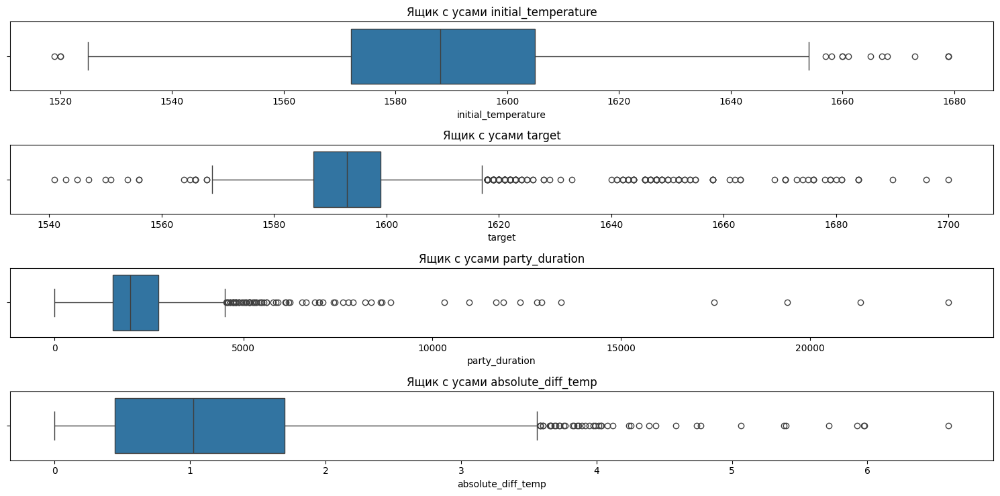

In [124]:
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(15, 7.5))

axes = axes.flatten()

columns_names = ['initial_temperature','target', 'party_duration', 'absolute_diff_temp']
for i, column in enumerate(df_temp_new.drop('key', axis=1).select_dtypes(include=['int', 'float'])):
    
    sns.boxplot(data=df_temp_new, x=column, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {columns_names[i]}') 

plt.tight_layout()


plt.show()

У нас есть много выбросов температуры, но это не аномалии, а выбросы.
Мы знаем, что этот процесс может длиться 50-70 минут, а возможно, и дольше, в исключительных случаях, если сталь не получит желаемых характеристик.

Однако нам, вероятно, придется избавиться от этих очень длительных процессов, поскольку они не представляют собой нормальную ситуацию для нашего ковшового рафинирования и могут ошибочно повлиять на результат нашей модели.

Вероятно, мы не собираемся сейчас отказываться от этого процесса, мы примем решение после изучения объединенного датафреймов.

In [125]:
# Процессы которие длиться более 1,5 часов
len(df_temp_new.query('party_duration > 5400'))/len(df_temp_new)*100

1.6579053780832995

Около 1,65% процессов длятся более полутора часов. Возможно, было бы разумно избавиться от этих очень длительных процессов ради нашей модели.

In [126]:
# Process over 2,5 hours
len(df_temp_new.query('party_duration > 9000'))/len(df_temp_new)*100

0.4852405984634048

Процессы длительностью более 2,5 часов составляют менее 0,5% объектов. 

После объединения датафреймы мы примем решение о том, от скольких партия мы собираемся избавиться.

### Изучение  абсолутной разницы температуры 

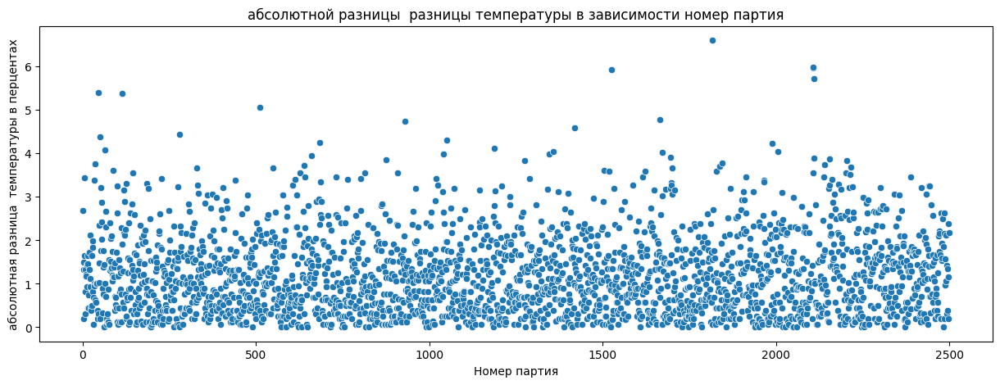

In [127]:
plt.figure(figsize=(15, 5))
sns.scatterplot(data=df_temp_new, x='key', y='absolute_diff_temp');
plt.xlabel('Номер партия');
plt.ylabel('абсолютная разница  температуры в перцентах');
plt.title('абсолютной разницы  разницы температуры в зависимости номер партия');

Мы видим, что большая часть абсолютная разница меншее 2% как мы изучили во время изучение статистика признаков df_temp_new.

In [128]:
df_temp_new = df_temp_new.drop(['absolute_diff_temp'],axis=1)

### Распределенние признаков

#### Распределенние начальной температуры

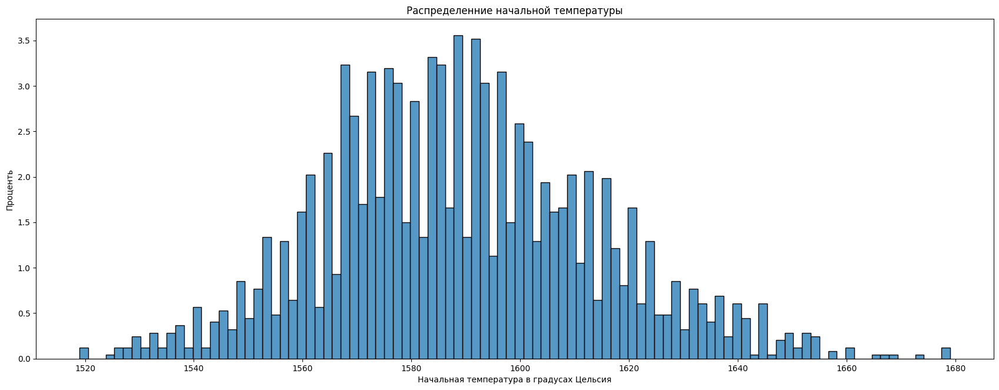

In [129]:
plt.figure(figsize=(21, 7.5))
sns.histplot(data=df_temp_new, x=df_temp_new['initial_temperature'], stat='percent', bins=100);
plt.xlabel('Начальная температура в градусах Цельсия');
plt.ylabel('Проценть');
plt.title('Распределенние начальной температуры');

Этот признак, начальная температура широко варьируется между 1520°C и 1660°C, причем большинство из них находится в диапазоне от 1560°C до 1620°C.

#### Распределенние целового признака

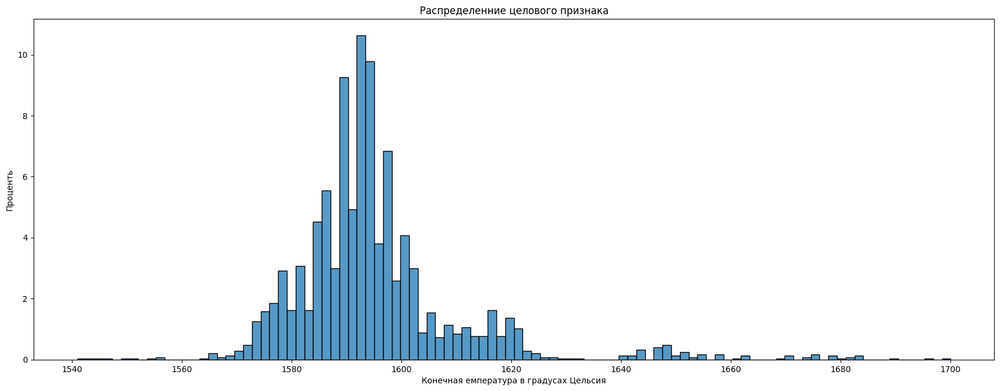

In [130]:
plt.figure(figsize=(21, 7.5))
sns.histplot(data=df_temp_new, x=df_temp_new['target'], stat='percent', bins=100);
plt.xlabel('Конечная емпература в градусах Цельсия');
plt.ylabel('Проценть');
plt.title('Распределенние целового признака');

Большая часть целевой температуры сосредоточена между 1590°C и 1600°C. Это окно очень узкое, что свидетельствует о том, насколько хорошо контролировалась температура.

#### Распределенние продолжительност процесса ковшового рафинирования

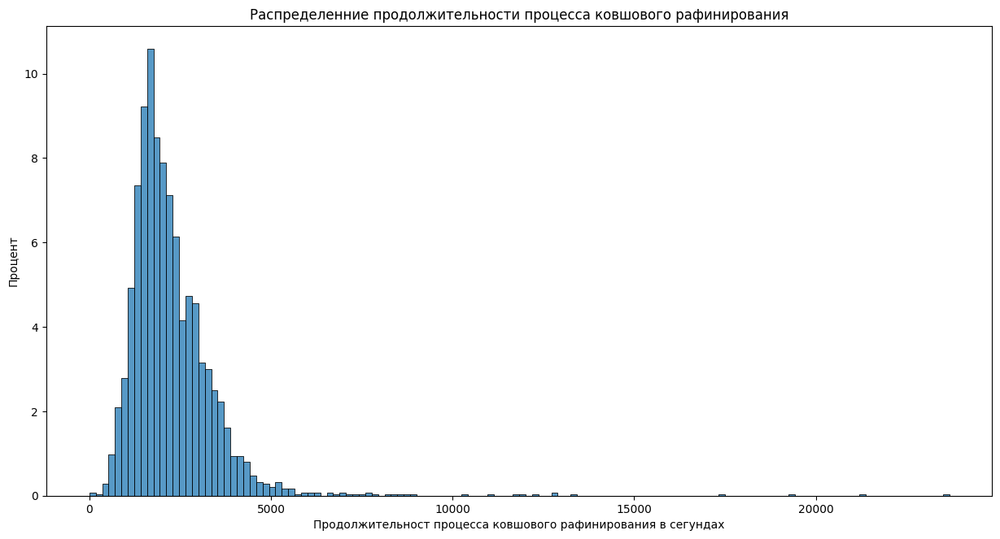

In [131]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_temp_new, x=df_temp_new['party_duration'], stat='percent');
plt.xlabel('Продолжительност процесса ковшового рафинирования в сегундах');
plt.ylabel('Процент');
plt.title('Распределенние продолжительности процесса ковшового рафинирования');

Мы ясно видим, что большинство процессов длятся менее 5000 секунд.

## Данные про времени добавки проволочних матерялов

### Отработка данных

#### Отрабртка пропусков

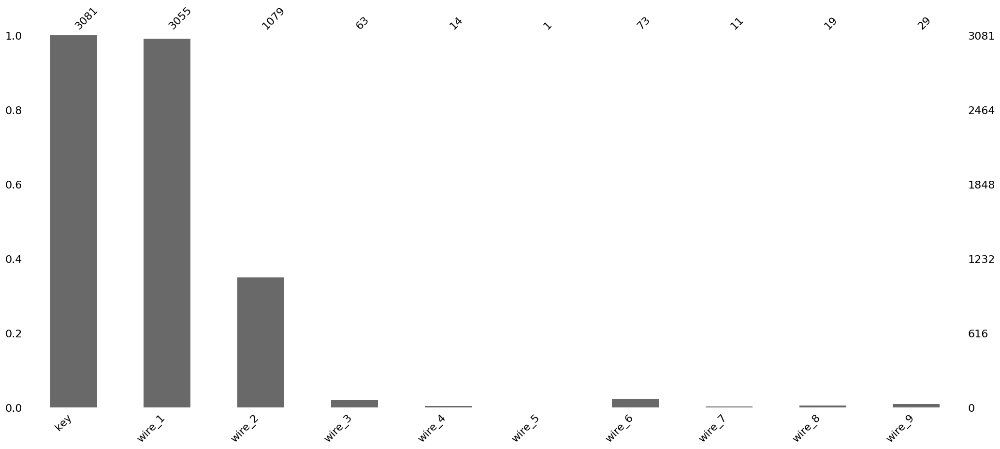

In [132]:
msno.bar(df_wire);

Как мы видели в первой части, этот датафрейм в основном относится к wire_1, который содержит 3055 непропущенных значений. После того, wire_2 хорошо представлен, но остальная часть базы данных содержит очень небольшое количество непропущенных значений.

Как для df_bulk, неправильные значения здесь означают, что материалы не были добавлены. Таким образом, мы можем заменить эти пропусков с 0.

Однако, как для df_bulk, прежде чем заменять пропущенные значения, мы создадим признак для определения количества используемых проводных материалов. Эту операцию проще выполнить до замены пропущенных значений, поэтому мы делаем это сейчас.

In [133]:
# Создание признаки определения количества добавленых проволочних матерялов для каждой партии
df_wire['nb_wired_materials'] = df_wire.drop('key', axis=1).count(axis=1)

In [134]:
df_wire.head(15)

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,nb_wired_materials
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2


In [135]:
# Замена пропущенных значений на 0
df_wire = df_wire.fillna(0)

In [136]:
df_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   key                 3081 non-null   int64  
 1   wire_1              3081 non-null   float64
 2   wire_2              3081 non-null   float64
 3   wire_3              3081 non-null   float64
 4   wire_4              3081 non-null   float64
 5   wire_5              3081 non-null   float64
 6   wire_6              3081 non-null   float64
 7   wire_7              3081 non-null   float64
 8   wire_8              3081 non-null   float64
 9   wire_9              3081 non-null   float64
 10  nb_wired_materials  3081 non-null   int64  
dtypes: float64(9), int64(2)
memory usage: 264.9 KB


#### Дубликаты

In [137]:
print(f'Есть {df_wire.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Статистика датафреймы

In [138]:
df_wire.drop('key', axis=1).describe()

,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,nb_wired_materials
count,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000
mean,100.044411,17.712733,3.874524,0.261019,0.004911,1.137695,0.035842,0.330697,0.321492,1.409932
std,42.841120,33.517734,30.310417,4.293865,0.272615,8.958111,0.774190,4.392677,3.806904,0.578078
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,70.281120,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,100.114563,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,125.798405,23.162880,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,330.314424,282.780152,385.008668,113.231044,15.132000,180.454575,32.847674,102.762401,90.053604,5.000000


Для основных проводных материалов, wire_1 и wire_2, мы видим, что среднее значение составляет соответственно 100 и 17,7.
75% материала из wire_1 были меньше или равны 125.

#### Ящик с усами

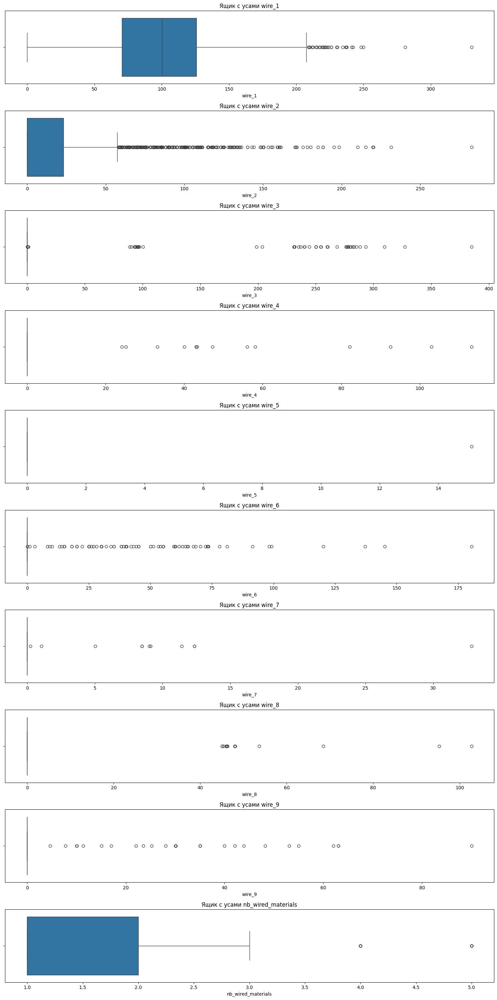

In [139]:
fig, axes = plt.subplots(nrows=10, ncols=1, figsize=(15, 30))

axes = axes.flatten()

columns_names = ['wire_'+str(n) for n in range(1, 10)]+['nb_wired_materials']
for i, col in enumerate(df_wire.drop('key', axis=1)):
    
    sns.boxplot(data=df_wire, x=col, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {columns_names[i]}') 

plt.tight_layout()


plt.show()

Как и в случае с df_bulk, у нас есть много выбросов, потому что у нас очень мало значений для многих из этих признаков. У нас есть некоторые значения, которые выглядят как аномалии, давайте посмотрим на них.

In [140]:
df_wire.query('wire_1 > 300')

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,nb_wired_materials
1732,1821,330.314424,69.337838,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [141]:
df_wire.query('wire_2 > 250')

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,nb_wired_materials
1201,1269,142.3656,282.780152,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [142]:
df_wire.query('wire_9 > 80')

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,nb_wired_materials
901,961,55.177196,70.122002,0.0,0.0,0.0,0.0,0.0,0.0,90.053604,3


Для остальных признаков у нас мало значений, чтобы рассмотреть возможность их удаления из датафреймы. Опять же, мы рассмотрим возможность удаления этих «дальние выбросов» поже.

### Распределенние признаков

#### Распределенние количество проволочных матерялов

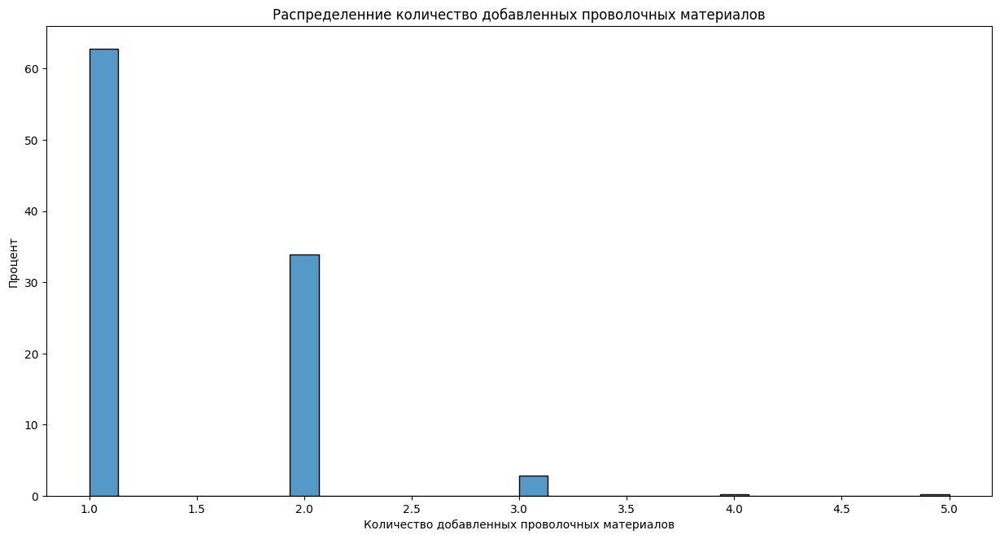

In [143]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=df_wire, x='nb_wired_materials', stat='percent')
plt.xlabel('Количество добавленных проволочных материалов');
plt.ylabel('Процент');
plt.title('Распределенние количество добавленных проволочных материалов');

Мы видим, что большую часть времени используются 1 тип проволочных материалов.

### Распределенние проволочных матерялов

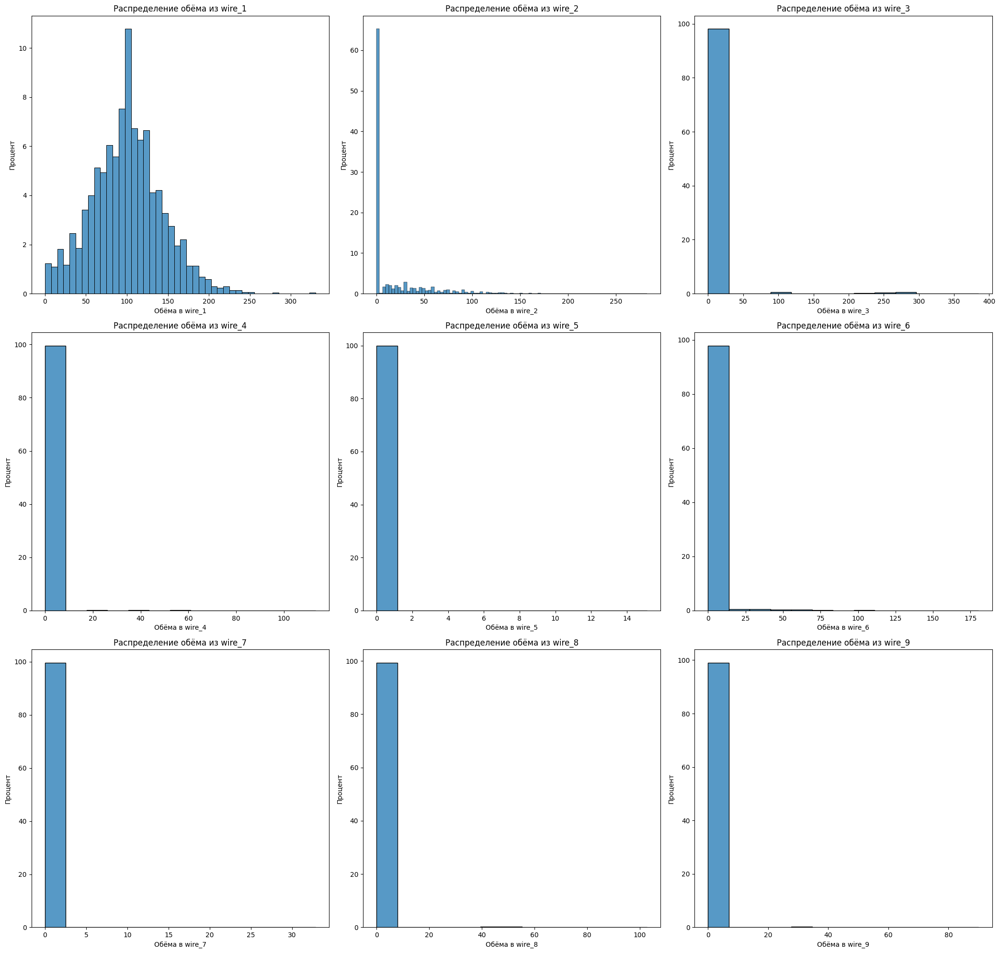

In [144]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(21, 20))

axes = axes.flatten()

columns_names = ['wire_'+str(n) for n in range(1, 10)]
for i, col in enumerate(df_wire.drop(['key', 'nb_wired_materials'], axis=1)):
    
    sns.histplot(data=df_wire, x=col, stat='percent', ax=axes[i]) 
    
    axes[i].set_title(f'Распределение обёма из {columns_names[i]}') 
    axes[i].set_xlabel(f'Обёма в {columns_names[i]}')
    axes[i].set_ylabel(f'Процент')

plt.tight_layout()


plt.show()

Как для df_bulk, действительно интересны для изучения только wire_1 и wire_2. Остальные материалы имеют очень узкое распространение из-за их низкой численности.

## Данные про времени добавки проволочних матерялов

### Features Engineering

#### Создание времени добавка для каждого материала

Мы продолжим работу с этими данными, как и с df_bulk_time, что означает создание нового объекта с использованием эталонного времени, которое является первым временем измерения датафреймы температуры.

#### Создание эталонного времени 

In [145]:
df_wire_time['ref_time'] = df_wire_time['key'].map(dict_min_temp['measure_time'])

In [146]:
df_wire_time.head()

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,ref_time
0,1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:02:04
1,2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:34:04
2,3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:06:44
3,4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:39:27
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:11:03


#### Создание признаков разницы между ref_time и времени добавки для каждого материала в секундах 

In [147]:
for col in range(1, 10):
    df_wire_time['wire_'+str(col)+'_dt'] = (df_wire_time['wire_'+str(col)] - df_wire_time['ref_time'])\
                                                                                            .dt.total_seconds()

In [148]:
 df_wire_time.head()

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,ref_time,wire_1_dt,wire_2_dt,wire_3_dt,wire_4_dt,wire_5_dt,wire_6_dt,wire_7_dt,wire_8_dt,wire_9_dt
0,1,2019-05-03 11:06:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:02:04,255.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:34:04,166.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:06:44,302.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:39:27,235.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:11:03,581.0,271.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [149]:
# Давайте создадим датафрейм с новыми функциями
df_wire_dt = df_wire_time.select_dtypes(exclude='datetime64')

### Отработка данных

#### Обработка пропусков

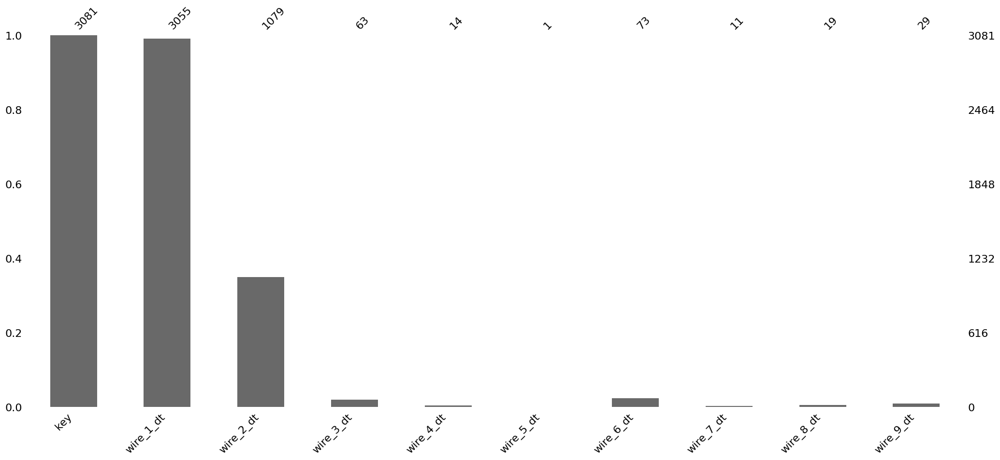

In [150]:
msno.bar(df_wire_dt);

Мы получили тот же график, что и для df_wire.

In [151]:
# Замена пропущенных значений на 0
df_wire_dt = df_wire_dt.fillna(0)

####  Дюбликаты

In [152]:
print(f'Есть {df_wire_time.duplicated().sum()} явных дубликатов.')

Есть 0 явных дубликатов.


#### Статистика датафреймы

In [153]:
df_wire_dt.drop('key', axis=1).describe()

,wire_1_dt,wire_2_dt,wire_3_dt,wire_4_dt,wire_5_dt,wire_6_dt,wire_7_dt,wire_8_dt,wire_9_dt
count,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000
mean,659.311263,142.134372,24.683220,10.197014,0.851996,12.369361,4.368711,1.972736,2.861733
std,821.436591,357.617315,307.130698,237.793523,47.291540,219.596686,198.378013,30.265919,41.903751
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,166.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,553.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,858.000000,157.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,21618.000000,5926.000000,12271.000000,11815.000000,2625.000000,11254.000000,10949.000000,999.000000,1502.000000


Для :
- wire_1:
        - Среднее время добавки составляет около 659 секунд после начала процесса.
        - 25% подключений было совершено за 166 секунд после начала процесса
- wire_2:
        - Среднее время добавки составляет около 142 секунд после начала процесса.


### Ящик с усами

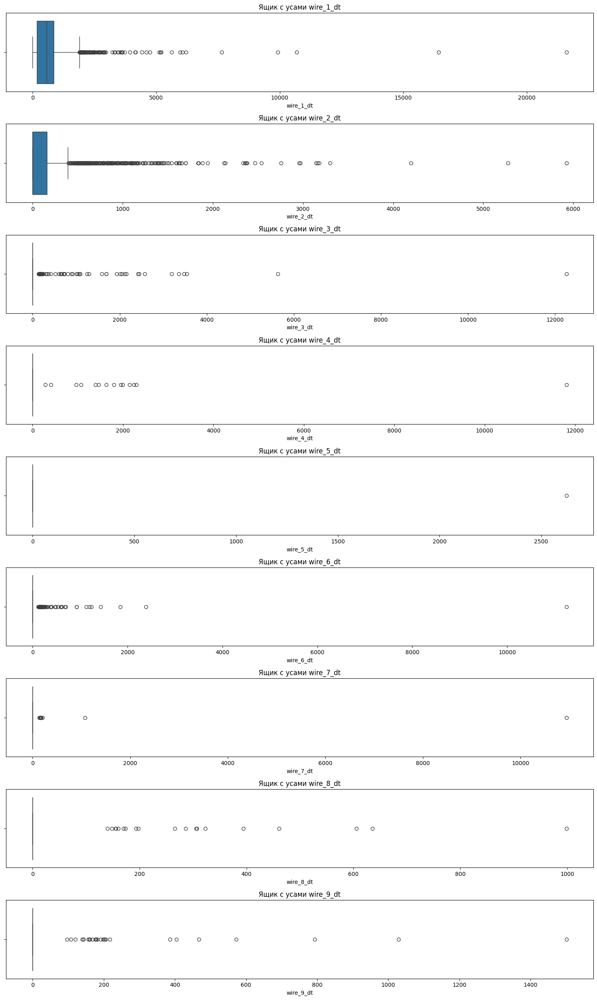

In [154]:
fig, axes = plt.subplots(nrows=9, ncols=1, figsize=(15, 25))

axes = axes.flatten()

columns_names = ['wire_'+str(n)+'_dt' for n in range(1, 10)]
for i, col in enumerate(df_wire_dt.drop('key', axis=1)):
    
    sns.boxplot(data=df_wire_dt, x=col, ax=axes[i]) 
    
    axes[i].set_title(f'Ящик с усами {columns_names[i]}') 

plt.tight_layout()


plt.show()

Like for df_wire, there are many outliers, we will try to figure out what do we need to keep after studiying the meger dataframe.

Как и в случае с df_wire, здесь много выбросов, мы попробуем выяснить, что нам нужно сохранить после изучения объединены датафрейм.

### Распределенние 

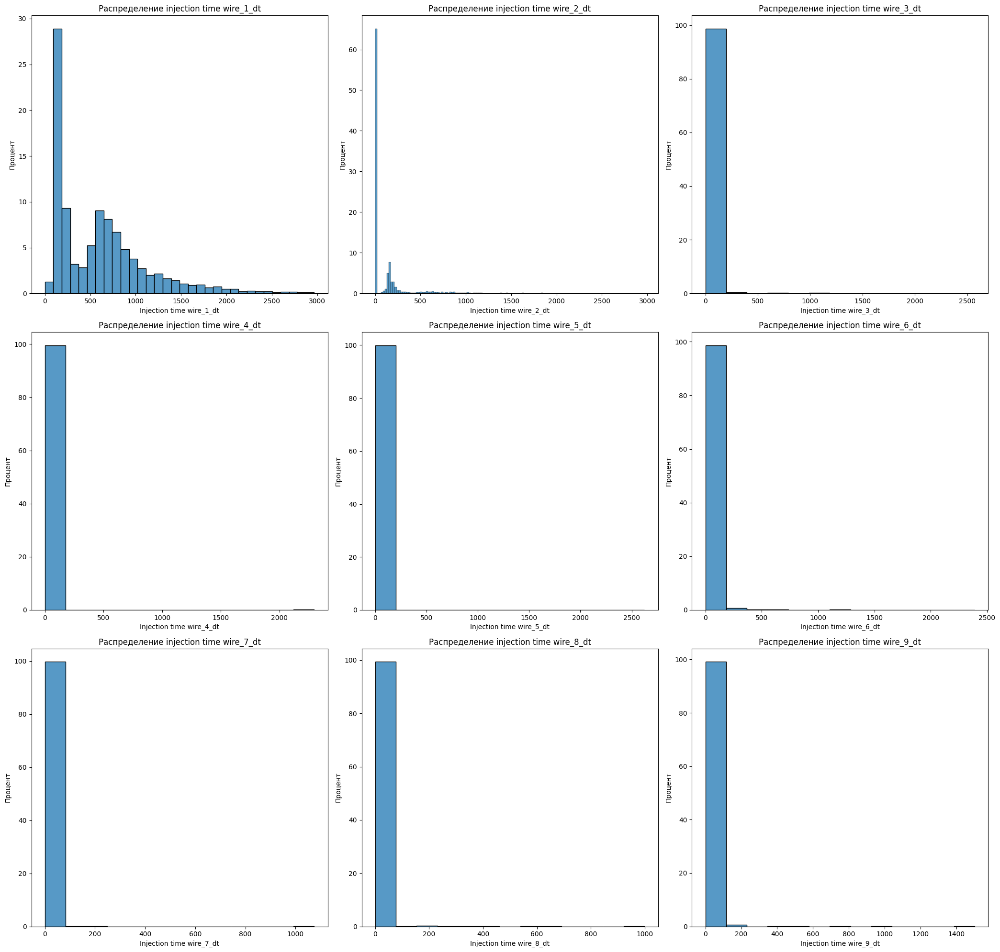

In [155]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(21, 20))

axes = axes.flatten()

columns_names = ['wire_'+str(n)+'_dt' for n in range(1, 10)]
for i, col in enumerate(df_wire_dt.drop('key', axis=1)):
    
    sns.histplot(data=df_wire_dt[df_wire_dt[col]<3000], x=col, stat='percent', ax=axes[i]) 
    
    axes[i].set_title(f'Распределение injection time {columns_names[i]}') 
    axes[i].set_xlabel(f'Injection time {columns_names[i]}')
    axes[i].set_ylabel(f'Процент')

plt.tight_layout()


plt.show()

Мы ясно видим, что wire_1 и wire_2 — наиболее интересные признаки этого датафреймы.

## Вывод

Эти данные были собраны в 2019. Мы вимдим что компания работает 7/7 и 24/24.

Ведили что у компании хорощо коэффициент мощности (средние значение - 0,82), это значит что электросеть оптимизирована. 

Большая часть активации электродов потребляет менее 0,05 МВт, и эти активаци в среднем длится около 3 минуты. Среднее количество активаций - 5.

Мы увидели, что наиболее часто используемыми сыпучих материалами являются объем_15, объем_14 и объем_12, а для проволочных материалов наиболее часто используются два материала — wire_1 и wire_2. Остальные материалы практически не использовались. Кроме bulk_4 и bulk_3 остальные материалы меншее чем 600 знаечение. Например для bulk_8 и wire_5 у нас есть только одно значение и для некоторых других материалов (wire_4, bulk_2 например) у нас есть толко 30-20 значение. 

Средняя начальная температура — 1589°С, средняя конечная температура (наш целовой признак) — 1595°С.
Распределение начальной температуры «широкое», большинство объектов принимают значения между 1520°C и 1660°C, в то время как распределение для целовего признака более узкое, большинство значений находится между 1585°C и 1605°C, что показывает, что температура в ковше хорошо контролируется и контролируется. Они не позволяют ему подниматься слишком высоко или слишком низко ради качества стали.

Среднее время проссесса составляет около 46 минуты, но некоторые процессы были дольше а некоторые даже очень длились (более 2 часов).

Обнаружено 5 аномалий:
- 1 в признак «reactive_power»
- 4 в признак «initial_temperature» (температура должна быть выше 1500°C)

Мы увидели, что партия 322 генерирует множество значителтных выбросов.

Данных по дуге был объединен для того, чтобы иметь один парти по объекту и объединить ее с другими датафреймами. Все датафреймы имеют разный размер, поэтому нам придется быть осторожными, когда мы будем объединять их вместе.

# Обеденниение таблицы

## Объединение материалов и газа воедино

вСогласно документации: <q>во все партии точно добавлялись сыпучие и проволочные материалы, везде была выполнена продувка газом и сплав всегда нагревался.</q>
Это означает, что нам нужно иметь в нашем датафрейме все объекты, в которых есть газ, сепучных и проволочных материалов. Другими словами, нам нужно объединить датафрейм, используя атрибут: «inner».

In [156]:
# Давайте объединим датафрейм с сепучных материалов
bulk_table = df_bulk.merge(df_bulk_dt, how='inner', on='key')

In [157]:
bulk_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 32 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   key                    3129 non-null   int64  
 1   bulk_1                 3129 non-null   float64
 2   bulk_2                 3129 non-null   float64
 3   bulk_3                 3129 non-null   float64
 4   bulk_4                 3129 non-null   float64
 5   bulk_5                 3129 non-null   float64
 6   bulk_6                 3129 non-null   float64
 7   bulk_7                 3129 non-null   float64
 8   bulk_8                 3129 non-null   float64
 9   bulk_9                 3129 non-null   float64
 10  bulk_10                3129 non-null   float64
 11  bulk_11                3129 non-null   float64
 12  bulk_12                3129 non-null   float64
 13  bulk_13                3129 non-null   float64
 14  bulk_14                3129 non-null   float64
 15  bulk

In [158]:
# Давайте объединим датафрейм с прополчных материалов
wire_table = df_wire.merge(df_wire_dt, how='inner', on='key')

In [159]:
wire_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   key                 3081 non-null   int64  
 1   wire_1              3081 non-null   float64
 2   wire_2              3081 non-null   float64
 3   wire_3              3081 non-null   float64
 4   wire_4              3081 non-null   float64
 5   wire_5              3081 non-null   float64
 6   wire_6              3081 non-null   float64
 7   wire_7              3081 non-null   float64
 8   wire_8              3081 non-null   float64
 9   wire_9              3081 non-null   float64
 10  nb_wired_materials  3081 non-null   int64  
 11  wire_1_dt           3081 non-null   float64
 12  wire_2_dt           3081 non-null   float64
 13  wire_3_dt           3081 non-null   float64
 14  wire_4_dt           3081 non-null   float64
 15  wire_5_dt           3081 non-null   float64
 16  wire_6

In [160]:
df_materials = bulk_table.merge(wire_table, how='inner', on='key')

In [161]:
df_materials.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3025 entries, 0 to 3024
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   key                    3025 non-null   int64  
 1   bulk_1                 3025 non-null   float64
 2   bulk_2                 3025 non-null   float64
 3   bulk_3                 3025 non-null   float64
 4   bulk_4                 3025 non-null   float64
 5   bulk_5                 3025 non-null   float64
 6   bulk_6                 3025 non-null   float64
 7   bulk_7                 3025 non-null   float64
 8   bulk_8                 3025 non-null   float64
 9   bulk_9                 3025 non-null   float64
 10  bulk_10                3025 non-null   float64
 11  bulk_11                3025 non-null   float64
 12  bulk_12                3025 non-null   float64
 13  bulk_13                3025 non-null   float64
 14  bulk_14                3025 non-null   float64
 15  bulk

In [162]:
# Теперь нам нужно объединить газ с «материальным» датафреймом
df_materials = df_materials.merge(df_gas, how='inner', on='key')

In [163]:
df_materials.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3023 entries, 0 to 3022
Data columns (total 52 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   key                    3023 non-null   int64  
 1   bulk_1                 3023 non-null   float64
 2   bulk_2                 3023 non-null   float64
 3   bulk_3                 3023 non-null   float64
 4   bulk_4                 3023 non-null   float64
 5   bulk_5                 3023 non-null   float64
 6   bulk_6                 3023 non-null   float64
 7   bulk_7                 3023 non-null   float64
 8   bulk_8                 3023 non-null   float64
 9   bulk_9                 3023 non-null   float64
 10  bulk_10                3023 non-null   float64
 11  bulk_11                3023 non-null   float64
 12  bulk_12                3023 non-null   float64
 13  bulk_13                3023 non-null   float64
 14  bulk_14                3023 non-null   float64
 15  bulk

### Объединение целевого объекта и датафрейм про дуги вместе

Нам также нужно использовать атрибут « inner» для метода 'merge', поскольку мы хотим получить данные из дуги и с нашего целого признака.

In [164]:
final_table = df_temp_new.merge(df_arc_arg, how='inner', on='key')

In [165]:
final_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2471 entries, 0 to 2470
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   key                  2471 non-null   int64  
 1   initial_temperature  2471 non-null   int64  
 2   target               2471 non-null   int64  
 3   party_duration       2471 non-null   float64
 4   active_power         2471 non-null   float64
 5   apparent_power       2471 non-null   float64
 6   energy               2471 non-null   float64
 7   nb_activations       2471 non-null   float64
 8   power_factor         2471 non-null   float64
 9   reactive_power       2471 non-null   float64
 10  warming_duration     2471 non-null   float64
dtypes: float64(8), int64(3)
memory usage: 212.5 KB


### Объединение целим признаком с датафреймом про материалов и газы

Здесь нам также нужно использовать атрибут «inner» с методом 'merge'.

In [166]:
final_table = final_table.merge(df_materials, how='inner', on='key')

In [167]:
final_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2325 entries, 0 to 2324
Data columns (total 62 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   key                    2325 non-null   int64  
 1   initial_temperature    2325 non-null   int64  
 2   target                 2325 non-null   int64  
 3   party_duration         2325 non-null   float64
 4   active_power           2325 non-null   float64
 5   apparent_power         2325 non-null   float64
 6   energy                 2325 non-null   float64
 7   nb_activations         2325 non-null   float64
 8   power_factor           2325 non-null   float64
 9   reactive_power         2325 non-null   float64
 10  warming_duration       2325 non-null   float64
 11  bulk_1                 2325 non-null   float64
 12  bulk_2                 2325 non-null   float64
 13  bulk_3                 2325 non-null   float64
 14  bulk_4                 2325 non-null   float64
 15  bulk

В качестве окончательного датафрейма мы получаем датафрейм с 2325 объектами (партиями) и 62 столбцы.

## EDA объединение датафреймы

### Создание признака общое количество добавленных материалов

In [168]:
final_table['total_added_materials'] = final_table['nb_powdered_materials'] + final_table['nb_wired_materials']

In [169]:
final_table = final_table.drop(['nb_powdered_materials', 'nb_wired_materials'], axis=1)

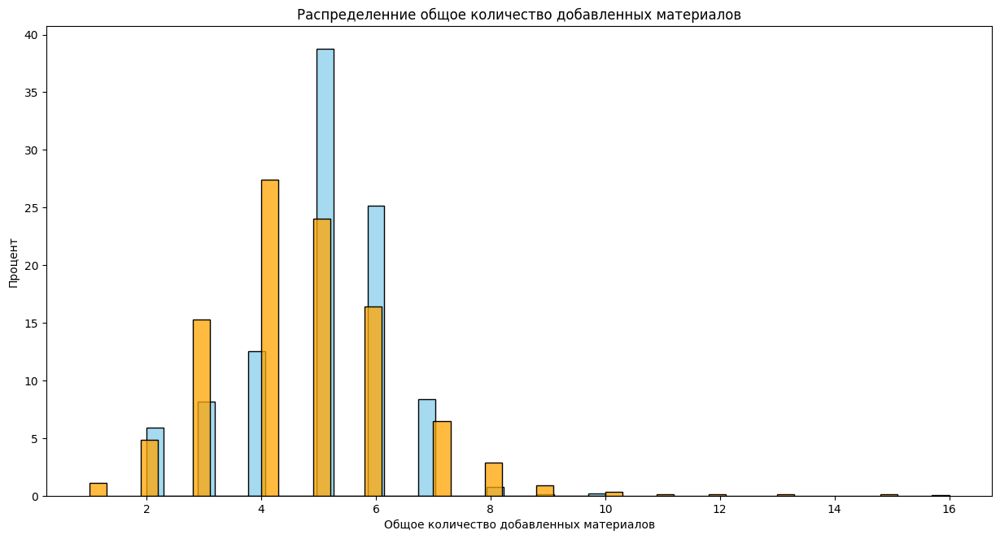

In [170]:
plt.figure(figsize=(15, 7.5))
sns.histplot(data=final_table, x='total_added_materials', color='skyblue', stat='percent')
sns.histplot(data=final_table, x='nb_activations', color='orange', stat='percent')

plt.xlabel('Общое количество добавленных материалов');
plt.ylabel('Процент');
plt.title('Распределенние общое количество добавленных материалов');

Я думал, что мы сможем увидеть более очевидную связь между общим количеством добавленных материалов и количеством активаций, но это не так. Поэтому гипотеза о том, что они используют электроды каждый раз после добавления материала, неверна.

### EDA для остальных признаков

In [171]:
# Столбец 'key' нам больше не нужен
final_table = final_table.drop('key', axis=1)

In [172]:
feature_config = sv.FeatureConfig(force_num = final_table.columns.to_list())
my_report = sv.analyze(final_table, target_feat='target', feat_cfg=feature_config)

                                             |      | [  0%]   00:00 -> (? left)


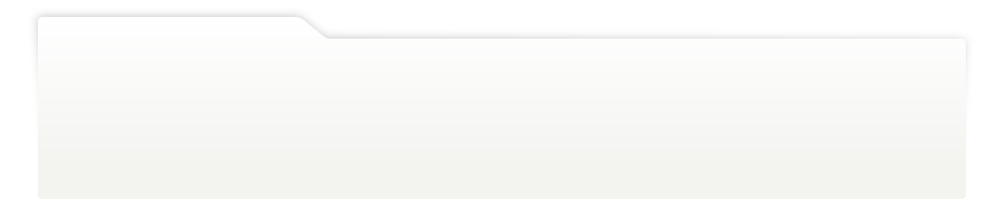
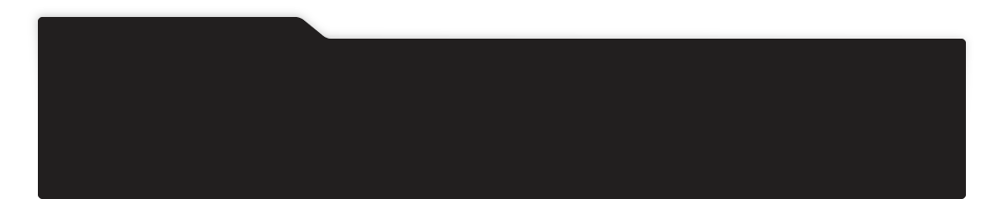
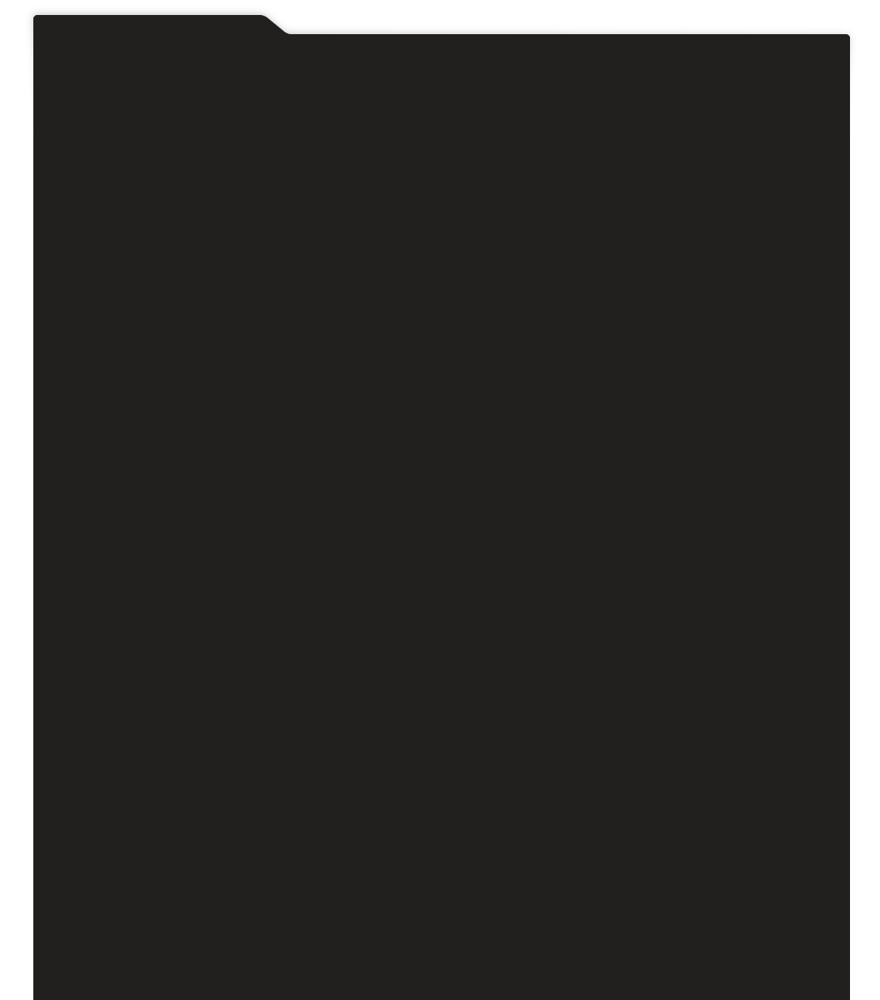
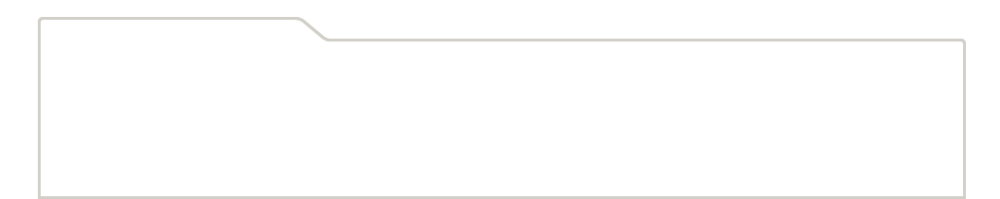
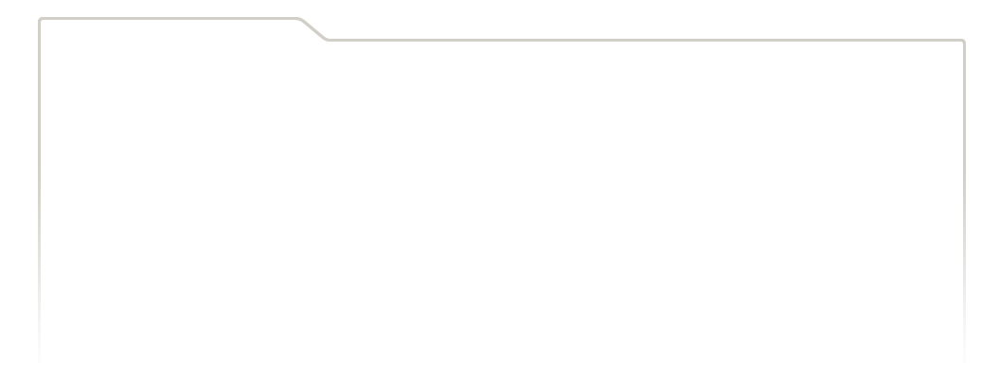
...
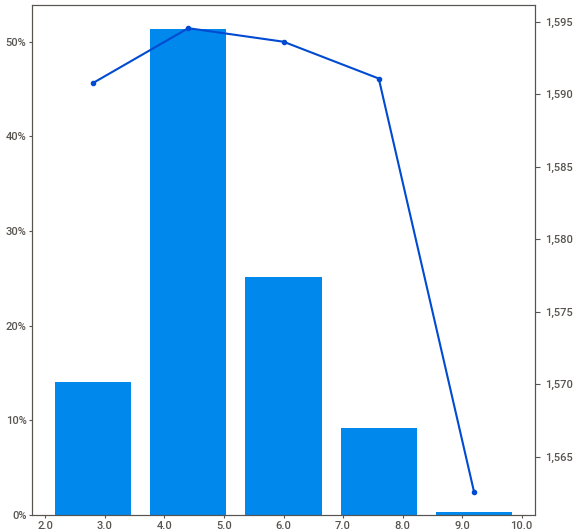
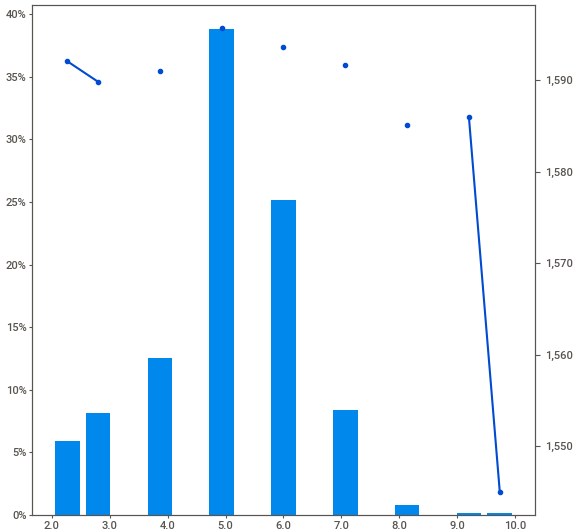
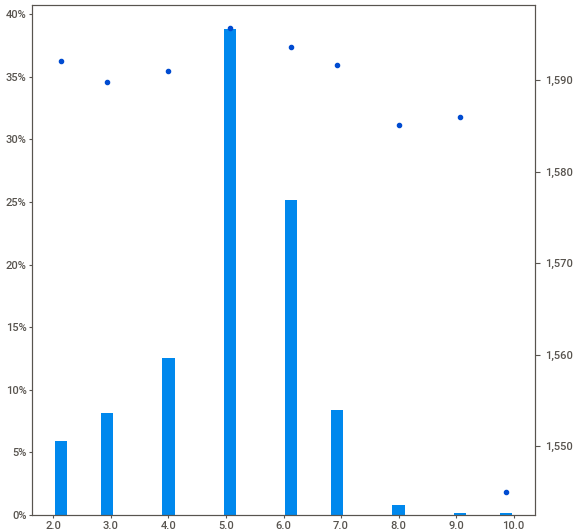
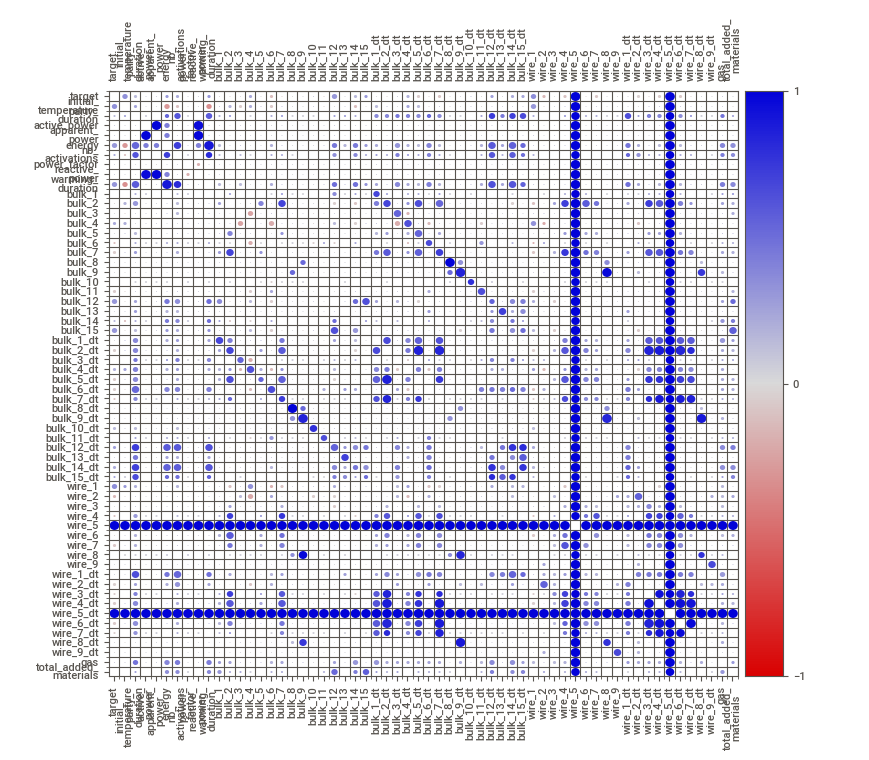
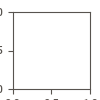

(likely due to only a single row containing non-NaN values for both correlated features)
Affected correlations:['target/wire_5', 'target/wire_5_dt', 'initial_temperature/wire_5', 'initial_temperature/wire_5_dt', 'party_duration/wire_5', 'party_duration/wire_5_dt', 'active_power/wire_5', 'active_power/wire_5_dt', 'apparent_power/wire_5', 'apparent_power/wire_5_dt', 'energy/wire_5', 'energy/wire_5_dt', 'nb_activations/wire_5', 'nb_activations/wire_5_dt', 'power_factor/wire_5', 'power_factor/wire_5_dt', 'reactive_power/wire_5', 'reactive_power/wire_5_dt', 'warming_duration/wire_5', 'warming_duration/wire_5_dt', 'bulk_1/wire_5', 'bulk_1/wire_5_dt', 'bulk_2/wire_5', 'bulk_2/wire_5_dt', 'bulk_3/wire_5', 'bulk_3/wire_5_dt', 'bulk_4/wire_5', 'bulk_4/wire_5_dt', 'bulk_5/wire_5', 'bulk_5/wire_5_dt', 'bulk_6/wire_5', 'bulk_6/wire_5_dt', 'bulk_7/wire_5', 'bulk_7/wire_5_dt', 'bulk_8/wire_5', 'bulk_8/wire_5_dt', 'bulk_9/wire_5', 'bulk_9/wire_5_dt', 'bulk_10/wire_5', 'bulk_10/wire_5_dt', 'bulk_11/wir

In [173]:
my_report.show_notebook()

Что касается признаки, мы замечаем, что распределение примерно такое же, как мы видели во время EDA для каждой признакых, который у нас был.

Кроме того, использование Sweetviz дало нам возможность увидеть изменение цели в зависимости от каждой признаки. 

Мы видим, что для «дальных выбросов», которые мы также видели во время предыдущего EDA, целевые значения сильно колебались для многих признаков.

Давайте посмотрим на эти выбросы и посмотрим, нужно ли нам удалить некоторые из них.

## Матрица корреляции

Мы собираемся удалить эти функции, а также «bulk_8», «bulk_8_dt», «wire_5», «wire_5_dt», поскольку их влияние на нашу модель будет незначительным.

In [174]:
# Удаление функций с уникальным значением
final_table = final_table.drop(['bulk_8', 'bulk_8_dt', 'wire_5', 'wire_5_dt'], axis=1)

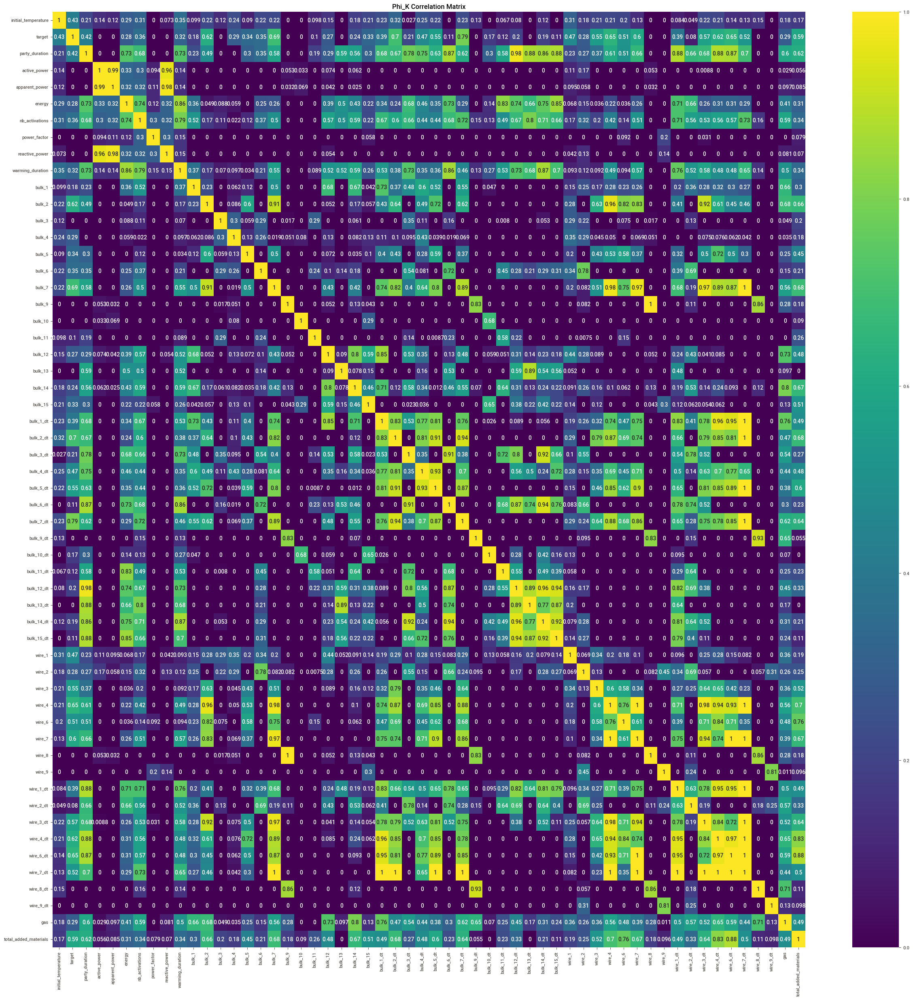

In [175]:
# Выбираем столбцы с числовым значением
interval_cols = final_table.select_dtypes(include=['int', 'float'])

# Вычисляем матрицу корреляции с использованием phik
corr_matrix = final_table.phik_matrix(interval_cols=interval_cols)

#cols_name = []

# Визуализация матрицы 
plt.figure(figsize=(30, 30))
sns.heatmap(corr_matrix, 
            #xticklabels=cols_name,
            #yticklabels=cols_name,
            annot=True, 
            cmap='viridis');
plt.title('Phi_K Correlation Matrix')
plt.show()

In [176]:
# Признаки, которые нужно удалить с низким показателем корреляции и которые окажут 
# незначительное влияние на нашу модель.
features_to_remove = corr_matrix[corr_matrix['target'] <= 0].index.to_list()
features_to_remove

['active_power',
 'apparent_power',
 'power_factor',
 'reactive_power',
 'bulk_3',
 'bulk_9',
 'bulk_10',
 'bulk_13',
 'bulk_9_dt',
 'bulk_13_dt',
 'wire_8',
 'wire_9',
 'wire_8_dt',
 'wire_9_dt']

In [177]:
# Удаляем незначительние признаки
final_table = final_table.drop(features_to_remove, axis=1)

In [178]:
# Нам также необходимо удалить коллинеарные элементы
colinear_features_to_remove = ['wire_6_dt', 'wire_7', 'wire_7_dt']

In [179]:
# Удаляем незначительние признаки коллинеарные со другими
final_table = final_table.drop(colinear_features_to_remove, axis=1)

Нам удалось обнаружить признаки, которые не будут играть большой роли для нашей модели из-за их низкой корреляции с целью или высокой коллинеарности с другими признаками.

Из матрицы корреляции мы также видим, что наиболее влиятельными параметрами являются:
- initial_temperature
- warming-duration
- bulk_2_dt
- bulk_7_dt
- bulk_7
- bulk_12
- wire_1
- wire_4
- wire_4_dt

## Подготовка данные для обучения

In [180]:
# Separating our features and target dataframe
X = final_table.drop(['target'], axis=1)
y = final_table['target']

In [181]:
RANDOM_STATE = 170225
TEST_SIZE = 0.25

# Разделение на треннировчной и тестовой
X_train, X_test, y_train, y_test = train_test_split(
                                    X, 
                                    y, 
                                    random_state=RANDOM_STATE, 
                                    test_size=TEST_SIZE) 

In [182]:
print(f'Размер тренировочный датафрейм: {len(X_train)}.')
print(f'Размер тестовой датафрейм: {len(X_test)}.')

Размер тренировочный датафрейм: 1743.
Размер тестовой датафрейм: 582.


# Обучение

Мы собираемся использовать разные модели для перекрестной проверки:
- RandomForestRegressor (случайный лес)
- LGMRegressor (бустингиь)
- MLPRegressor (нейронные сети)
- SVR

Метрикой, которую мы собираемся использовать, является MAE.

## Первая Кросс-Валидация

### Пайплайн для признаков

In [213]:
num_col = X.columns

num_pipe = Pipeline([
    ('scale', MinMaxScaler())
])

# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
     ('num', num_pipe, num_col)
    ], 
    remainder='passthrough'
)

### Параметры моделей для кросс-валидации

In [220]:
param_grid = [
         # словарь для модели SVRegressor()
    {
        'model':[SVR()],
        'model__kernel':[ 'poly', 'linear', 'rbf'],
        'model__C': [10, 100, 1000],
        'model__gamma': [0.1, 0.01, 0.001],
       },
     # словарь для модели LGBMRegressor()
    {
        'model': [lgb.LGBMRegressor(random_state=RANDOM_STATE)],
        'model__n_estimators': [100],
        'model__learning_rate': [1e-3, 0.1],
        'model__max_depth':[1, 7],
        'model__num_leaves': [2, 2000],
        'model__min_data_in_leaf': [1, 100]
    },
    # словарь для модели RandomForestRegressor()
    {
        'model':[RandomForestRegressor(random_state=RANDOM_STATE)],
        'model__n_estimators': [48, 56],
        'model__max_features': [2,14],
        'model__min_samples_split':[2,14],
        'model__min_samples_leaf':[2,14],
        'model__max_depth': [1,7]

      },
   # словарь для модели MLPRegressor (neural network)
    {
        'model':[MLPRegressor(random_state=RANDOM_STATE, 
                              max_iter=10000,
                              early_stopping=True,
                              validation_fraction=0.25)
                ], 
        'model__learning_rate': ['adaptive', 'constant'],
        'model__alpha':[ 0.1, 0.01],
        'model__solver':['lbfgs'],
        'model__learning_rate_init': [0.1, 0.01, 0.001],
        'model__hidden_layer_sizes':[(24, 16, 8),(16, 8)]
    }
     ]

# создаём итоговый пайплайн: подготовка данных и модель
pipe_final= Pipeline([
    ('preprocessor', data_preprocessor),
    ('model', LinearRegression())
])


In [221]:
# Методы автоматизированного подбора гиперпараметров RandomizedSearchCV
randomized_search = RandomizedSearchCV(
                                    pipe_final, 
                                    param_grid, 
                                    cv=5,
                                    scoring='neg_mean_absolute_error',
                                    random_state=RANDOM_STATE,
                                    error_score="raise",
                                    n_jobs=-1
                                    )

# Начинаем процесс кросс-валидация
randomized_search.fit(X_train, y_train)

/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/lightgbm/basic.py:2137: UserWarning: feature_name keyword has been found in `params` and will be ignored.
Please use feature_name argument of the Dataset constructor to pass this parameter.
  _log_warning(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/lightgbm/basic.py:2137: UserWarning: feature_name keyword has been found in `params` and will be ignored.
Please use feature_name argument of the Dataset constructor to pass this parameter.
  _log_warning(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/lightgbm/basic.py:2137: UserWarning: feature_name keyword has been found in `params` and will be ignored.
Please use feature_name argument of the Dataset constructor to pass this parameter.
  _log_warning(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor 

RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scale',
                                                                                                MinMaxScaler())]),
                                                                               ['initial_temperature',
                                                                                'party_duration',
                                                                                'energy',
                                                                                'nb_activations',
                                                                                'warming_duration',
                                                                                'bulk_1',
                                                                                'bulk_2',
                                                                                'bulk_4',
                                                                                'bulk_5',
                                                                                'bulk_6',
                                                                                'bulk_7',
                                                                                'bulk_11',
                                                                                'bulk_12'...
                                        {'model': [MLPRegressor(early_stopping=True,
                                                                max_iter=10000,
                                                                random_state=170225,
                                                                validation_fraction=0.25)],
                                         'model__alpha': [0.1, 0.01],
                                         'model__hidden_layer_sizes': [(24, 16,
                                                                        8),
                                                                       (16, 8)],
                                         'model__learning_rate': ['adaptive',
                                                                  'constant'],
                                         'model__learning_rate_init': [0.1,
                                                                       0.01,
                                                                       0.001],
                                         'model__solver': ['lbfgs']}],
                   random_state=170225, scoring='neg_mean_absolute_error')

### Результат для первой кросс-валидации

In [186]:
# Итог гиперпараметр тюнинг
report_randomized_search = pd.DataFrame(randomized_search.cv_results_)
pd.set_option('display.max_colwidth', None)
report_randomized_search\
.sort_values('rank_test_score', ascending=True)[['params',\
                                                 'mean_fit_time', 'mean_score_time',\
                                                 'mean_test_score', 'rank_test_score']].head(10)

,params,mean_fit_time,mean_score_time,mean_test_score,rank_test_score
7,"{'model__kernel': 'rbf', 'model__gamma': 0.1, 'model__C': 100, 'model': SVR()}",0.198489,0.045842,-5.839314,1
8,"{'model__kernel': 'linear', 'model__gamma': 0.001, 'model__C': 10, 'model': SVR()}",0.142769,0.020319,-6.009898,2
3,"{'model__kernel': 'rbf', 'model__gamma': 0.01, 'model__C': 100, 'model': SVR()}",0.151774,0.048479,-6.290990,3
6,"{'model__solver': 'lbfgs', 'model__learning_rate_init': 0.001, 'model__learning_rate': 'adaptive', 'model__hidden_layer_sizes': (16, 8), 'model__alpha': 0.1, 'model': MLPRegressor(early_stopping=True, max_iter=10000, random_state=170225, validation_fraction=0.25)}",6.596173,0.003752,-6.512529,4
0,"{'model__solver': 'lbfgs', 'model__learning_rate_init': 0.001, 'model__learning_rate': 'adaptive', 'model__hidden_layer_sizes': (24, 16, 8), 'model__alpha': 0.1, 'model': MLPRegressor(early_stopping=True, max_iter=10000, random_state=170225, validation_fraction=0.25)}",12.757030,0.005399,-6.553011,5
9,"{'model__n_estimators': 56, 'model__min_samples_split': 14, 'model__min_samples_leaf': 2, 'model__max_features': 14, 'model__max_depth': 7, 'model': RandomForestRegressor(random_state=170225)}",0.365050,0.014038,-6.561891,6
2,"{'model__n_estimators': 48, 'model__min_samples_split': 2, 'model__min_samples_leaf': 14, 'model__max_features': 14, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.126707,0.010708,-7.709899,7
4,"{'model__n_estimators': 56, 'model__min_samples_split': 14, 'model__min_samples_leaf': 2, 'model__max_features': 14, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.118591,0.010781,-7.761133,8
5,"{'model__n_estimators': 48, 'model__min_samples_split': 14, 'model__min_samples_leaf': 14, 'model__max_features': 2, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.090214,0.014396,-7.897052,9
1,"{'model__num_leaves': 2, 'model__n_estimators': 100, 'model__min_data_in_leaf': 1, 'model__max_depth': 1, 'model__learning_rate': 0.001, 'model': LGBMRegressor(random_state=170225)}",0.223739,0.011163,-8.092424,10


### Лучшая модель для первой кросс-валидация

In [187]:
model = randomized_search.best_estimator_
model

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('scale',
                                                                   MinMaxScaler())]),
                                                  Index(['initial_temperature', 'party_duration', 'energy', 'nb_activations',
       'warming_duration', 'bulk_1', 'bulk_2', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_11', 'bulk_12', 'bulk_14', 'bulk_15', 'bulk_1_dt',
       'bulk_2_dt', 'bulk_3_dt', 'bulk_4_dt', 'bulk_5_dt', 'bulk_6_dt',
       'bulk_7_dt', 'bulk_10_dt', 'bulk_11_dt', 'bulk_12_dt', 'bulk_14_dt',
       'bulk_15_dt', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6',
       'wire_1_dt', 'wire_2_dt', 'wire_3_dt', 'wire_4_dt', 'gas',
       'total_added_materials'],
      dtype='object'))])),
                ('model', SVR(C=100, gamma=0.1))])

##  Анализ важности признакок для лучщей модели (SVR с 'rbf' solver)

In [188]:
# Fitting модель
model.fit(X_train, y_train)

# Permutation importance
perm_importance = permutation_importance(model, X_test, y_test, random_state=RANDOM_STATE)

# Получить имена признаков
feature_names = model[0].get_feature_names_out()

# Получить индексы
sorted_idx = abs(perm_importance.importances_mean).argsort()

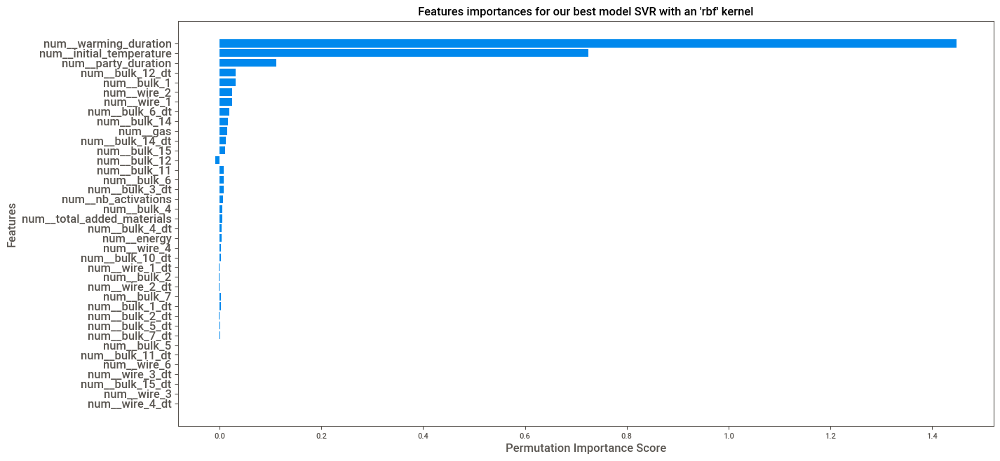

In [189]:
# Построение графиков наиболее важных признаков
plt.figure(figsize=(15, 7.5))
plt.barh(feature_names[sorted_idx], perm_importance.importances_mean[sorted_idx]);
plt.xlabel('Permutation Importance Score', fontsize=12)
plt.ylabel('Features', fontsize=12);
plt.yticks(fontsize=12)
plt.title('Features importances for our best model SVR with an \'rbf\' kernel');

Наши самые важные особенности:
- продолжительность прогрева электродов
- начальная температура
- продолжительность процесса ковшового рафинирования
- затраченная энергия (которая зависит от продолжительности прогрева электродов)
- объем bulk_1 
- объем wire_2
- объем wire_1

## Вторая кросс-валидация

### Удаление менее значительних признаков из обучающего датафрейма

In [190]:
feature_names[sorted_idx][:20]

array(['num__wire_4_dt', 'num__wire_3', 'num__bulk_15_dt',
       'num__wire_3_dt', 'num__wire_6', 'num__bulk_11_dt', 'num__bulk_5',
       'num__bulk_7_dt', 'num__bulk_5_dt', 'num__bulk_2_dt',
       'num__bulk_1_dt', 'num__bulk_7', 'num__wire_2_dt', 'num__bulk_2',
       'num__wire_1_dt', 'num__bulk_10_dt', 'num__wire_4', 'num__energy',
       'num__bulk_4_dt', 'num__total_added_materials'], dtype=object)

In [191]:
list_features_to_drop = [f.replace("num__", "") for f in list(feature_names[sorted_idx][:20])]

In [192]:
X_train_1 = X_train.drop(list_features_to_drop, axis=1)

In [193]:
num_col_1 = X_train_1.columns

num_pipe = Pipeline([
    ('scale', MinMaxScaler())
])

# создаём общий пайплайн для подготовки данных
data_preprocessor_1 = ColumnTransformer(
    [
     ('num', num_pipe, num_col_1)
    ], 
    remainder='passthrough'
)

### Выполнение второй кросс-валидации

In [194]:
# создаём итоговый пайплайн: подготовка данных и модель
pipe_final_1 = Pipeline([
    ('preprocessor', data_preprocessor_1),
    ('model', LinearRegression())
])

In [195]:
# Методы автоматизированного подбора гиперпараметров RandomizedSearchCV
randomized_search_1 = RandomizedSearchCV(
                                    pipe_final_1, 
                                    param_grid, 
                                    cv=5,
                                    scoring='neg_mean_absolute_error',
                                    random_state=RANDOM_STATE,
                                    error_score="raise",
                                    n_jobs=-1
                                    )

# Начинаем процесс кросс-валидация
randomized_search_1.fit(X_train_1, y_train)

/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/home/regis/anaconda3/envs/gpu_env_torch/lib/python3.11/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does 

RandomizedSearchCV(cv=5, error_score='raise',
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('num',
                                                                               Pipeline(steps=[('scale',
                                                                                                MinMaxScaler())]),
                                                                               Index(['initial_temperature', 'party_duration', 'nb_activations',
       'warming_duration', 'bulk_1', 'bulk_4', 'bulk_6', 'bulk_11', 'bulk_12',
       'bulk_14', 'bulk_15', 'bulk_3_d...
                                        {'model': [MLPRegressor(early_stopping=True,
                                                                max_iter=10000,
                                                                random_state=170225,
                                                                validation_fraction=0.25)],
                                         'model__alpha': [0.1, 0.01],
                                         'model__hidden_layer_sizes': [(24, 16,
                                                                        8),
                                                                       (16, 8)],
                                         'model__learning_rate': ['adaptive',
                                                                  'constant'],
                                         'model__learning_rate_init': [0.1,
                                                                       0.01,
                                                                       0.001],
                                         'model__solver': ['lbfgs']}],
                   random_state=170225, scoring='neg_mean_absolute_error')

In [196]:
# Итог гиперпараметр тюнинг
report_randomized_search_1 = pd.DataFrame(randomized_search_1.cv_results_)
pd.set_option('display.max_colwidth', None)
report_randomized_search_1\
.sort_values('rank_test_score', ascending=True)[['params',\
                                                 'mean_fit_time', 'mean_score_time',\
                                                 'mean_test_score', 'rank_test_score']].head(10)

,params,mean_fit_time,mean_score_time,mean_test_score,rank_test_score
7,"{'model__kernel': 'rbf', 'model__gamma': 0.1, 'model__C': 100, 'model': SVR()}",0.160837,0.039925,-5.748614,1
0,"{'model__solver': 'lbfgs', 'model__learning_rate_init': 0.001, 'model__learning_rate': 'adaptive', 'model__hidden_layer_sizes': (24, 16, 8), 'model__alpha': 0.1, 'model': MLPRegressor(early_stopping=True, max_iter=10000, random_state=170225, validation_fraction=0.25)}",6.055241,0.003648,-5.884114,2
6,"{'model__solver': 'lbfgs', 'model__learning_rate_init': 0.001, 'model__learning_rate': 'adaptive', 'model__hidden_layer_sizes': (16, 8), 'model__alpha': 0.1, 'model': MLPRegressor(early_stopping=True, max_iter=10000, random_state=170225, validation_fraction=0.25)}",2.777360,0.004195,-5.887449,3
8,"{'model__kernel': 'linear', 'model__gamma': 0.001, 'model__C': 10, 'model': SVR()}",0.135817,0.020859,-5.891870,4
9,"{'model__n_estimators': 56, 'model__min_samples_split': 14, 'model__min_samples_leaf': 2, 'model__max_features': 14, 'model__max_depth': 7, 'model': RandomForestRegressor(random_state=170225)}",0.515307,0.013506,-6.249653,5
3,"{'model__kernel': 'rbf', 'model__gamma': 0.01, 'model__C': 100, 'model': SVR()}",0.143293,0.036371,-6.323725,6
2,"{'model__n_estimators': 48, 'model__min_samples_split': 2, 'model__min_samples_leaf': 14, 'model__max_features': 14, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.162725,0.013035,-7.704015,7
4,"{'model__n_estimators': 56, 'model__min_samples_split': 14, 'model__min_samples_leaf': 2, 'model__max_features': 14, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.154275,0.012340,-7.706612,8
5,"{'model__n_estimators': 48, 'model__min_samples_split': 14, 'model__min_samples_leaf': 14, 'model__max_features': 2, 'model__max_depth': 1, 'model': RandomForestRegressor(random_state=170225)}",0.084087,0.012037,-7.768517,9
1,"{'model__num_leaves': 2, 'model__n_estimators': 100, 'model__min_data_in_leaf': 1, 'model__max_depth': 1, 'model__learning_rate': 0.001, 'model': LGBMRegressor(random_state=170225)}",0.186436,0.007496,-8.092424,10


### Лучшая модель для второй кросс-валидации

In [197]:
model_1 = randomized_search_1.best_estimator_
model_1

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('scale',
                                                                   MinMaxScaler())]),
                                                  Index(['initial_temperature', 'party_duration', 'nb_activations',
       'warming_duration', 'bulk_1', 'bulk_4', 'bulk_6', 'bulk_11', 'bulk_12',
       'bulk_14', 'bulk_15', 'bulk_3_dt', 'bulk_6_dt', 'bulk_12_dt',
       'bulk_14_dt', 'wire_1', 'wire_2', 'gas'],
      dtype='object'))])),
                ('model', SVR(C=100, gamma=0.1))])

### Вывов

Самая лучшая модель, полученной после перекрестной проверки, является SVR(C=100, gamma=0.1, solver='rbf').

#  Протестирование модель и продемонстрация её работу

## Проверка качетсво модели

### Прогнозы

In [198]:
# Наше предзананы целовой признак
y_test_pred = model_1.predict(X_test)

### Метрик MAE и R2

In [199]:
# метрики на тестовом выборке
mae = mean_absolute_error(y_test, y_test_pred)
print(f'MAE за лучшую модель= {mae}°C.')
r2 = round(r2_score(y_test, y_test_pred),2)
print(f'R2 за лучшую модель = {r2:.2f}')

MAE за лучшую модель= 6.069999414773822°C.
R2 за лучшую модель = 0.48


Мы немного переобучились, но все равно получили результат ниже 6,8 для MAE. Однако метрик R2 - средная значения.

### Исследование остатков

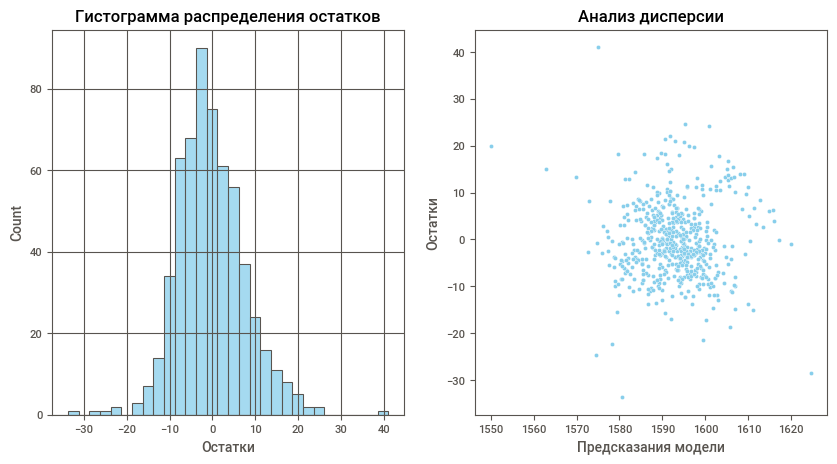

In [200]:
# проведем анализ остатков
# перед этим рассчитаем остатки

residuals = y_test - y_test_pred
# построим графики по количественным признакам — гистограмму частотности 
# распределения и диаграмму рассеяния
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
sns.histplot(data=residuals, bins=30, color='skyblue', ax=axes[0])
axes[0].set_title('Гистограмма распределения остатков')
axes[0].set_xlabel('Остатки')
axes[0].grid()

# диаграмму рассеяния
sns.scatterplot(x=y_test_pred,y=residuals, color='skyblue', ax=axes[1])
axes[1].set_xlabel('Предсказания модели')
axes[1].set_ylabel('Остатки')
axes[1].set_title('Анализ дисперсии')
plt.show()

Остаток на самом деле не очень симметричен значению 0, однако дисперсия выглядит нормально, несмотря на некоторую пустую область.

### Диаграм факты-прогнозы

In [201]:
df_res = pd.DataFrame(zip(y_test, y_test_pred), columns = ['truth', 'predictions'])
df_res.head()

,truth,predictions
0,1599,1594.675518
1,1617,1606.819706
2,1584,1589.344193
3,1592,1586.390140
4,1599,1590.668426


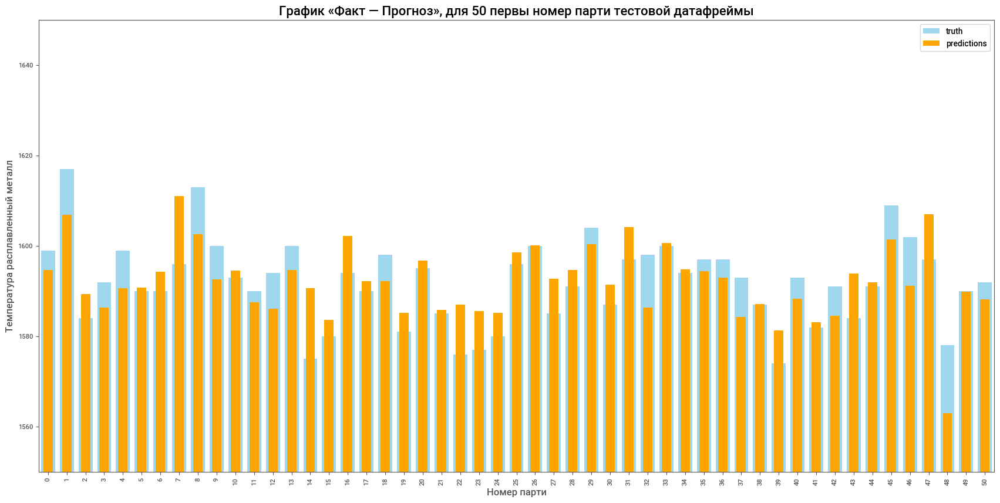

In [202]:
fig, ax = plt.subplots(figsize=(21,10))

ax = df_res.loc[0:50, 'truth'].plot(kind='bar', color='skyblue', width=.75, legend=True, alpha=0.8);
df_res.loc[0:50, 'predictions'].plot(kind='bar', color='orange', width=.5, alpha=1, legend=True);
ax.set_ylim(ymin=1550)
ax.set_ylim(ymax=1650)
ax.set_title(f'График «Факт — Прогноз», для 50 первы номер парти тестовой датафреймы', fontsize=16) ;
ax.set_xlabel(f'Номер парти', fontsize=12);
ax.set_ylabel(f'Температура расплавленный металл', fontsize=12);

Мы заметим что чем выше или ниже температура, тем больше ошибка. Другими словами, модель испытывает трудности с предсказанием температур на границах диапазона конечных температур.

Для температуры, близкой к среднему значению диапазона конечной температуры, прогнозы дают хорошие результаты.

### Относительная ошибка между истинными значениями и прогнозами

In [203]:
# Сосздание признак относительныи ошибки между истинными значениями и прогнозами
df_res['relative_error_pred'] = (df_res['predictions']-df_res['truth'])/df_res['truth']*100

In [204]:
df_res['relative_error_pred'].describe(percentiles=[0.25, 0.5, 0.6, 0.7, 0.75])

count    582.000000
mean       0.024898
std        0.498622
min       -2.537528
25%       -0.261899
50%        0.064297
60%        0.171178
70%        0.268186
75%        0.338026
max        2.176265
Name: relative_error_pred, dtype: float64

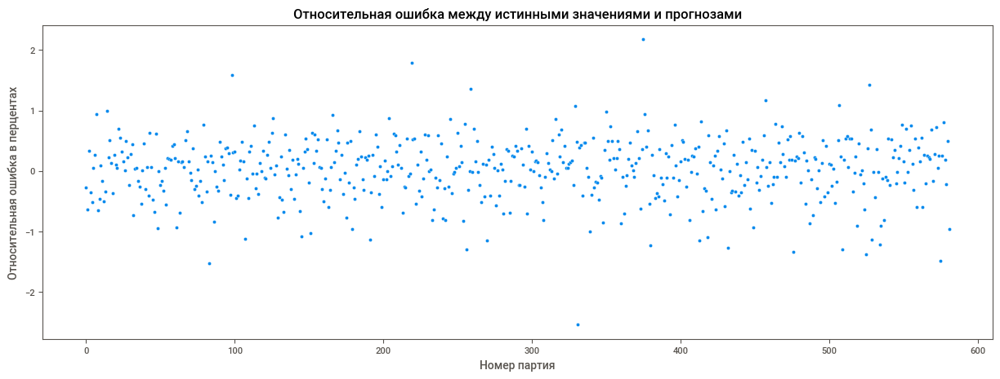

In [205]:
plt.figure(figsize=(15, 5))
sns.scatterplot(data=df_res, x=df_res.index, y='relative_error_pred');
plt.xlabel('Номер партия');
plt.ylabel('Относительная ошибка в перцентах');
plt.title('Относительная ошибка между истинными значениями и прогнозами');

Мы видим, что относительная разница между прогнозами и истинными значениями составляет от 1,2% до -1,5%, что выглядит нормально. Однако разница в 1% при температуре 1600 °C составляет 16 °C, чего достаточно, чтобы изменить характеристики стали.

### Статистика абсолютная ошибка между истинными значениями и прогнозами

In [206]:
# Сосздание признак абсолютни ошибки между истинными значениями и прогнозами
df_res['absolute_error_pred'] = np.abs((df_res['predictions']-df_res['truth'])/df_res['truth'])*100

In [207]:
df_res['absolute_error_pred'].describe()

count    582.000000
mean       0.380952
std        0.322290
min        0.000738
25%        0.148505
50%        0.306563
75%        0.527628
max        2.537528
Name: absolute_error_pred, dtype: float64

Мы видим, у 50% партии абсолютная ошибка - 0,3% или менее. Для температуры 1600°С, 0,3% абсолютная ошибка соответствует 4,8°С.
Мы видим, у 75% партии абсолютная ошибка - 0,52% или менее. Для температуры 1600°С, 0,52% абсолютная ошибка соответствует 8,32°С.

Результат может быть удовлетворительным для 50% данных, но в остальном мы не уверены, поскольку, возможно, 8°С может повлиять на характеристики стали.

### Сравниние результаты лучшей моделей и dummy регрессор

In [208]:
lm_dummy = DummyRegressor(strategy = 'mean').fit(X_train, y_train) 

In [209]:
y_predict_dummy = lm_dummy.predict(X_test)

In [210]:
# метрики на тестовом выборке для фиктивный регрессор
mae_dummy = mean_absolute_error(y_test, y_predict_dummy)
print(f'MAE за фиктивный регрессор = {mae_dummy}°C.')

MAE за фиктивный регрессор = 8.099311334685837°C.


Этот балл хуже требуемого балла 6,8 и хуже резултат нашей лучшей модели (6,07).

## Отношение между двумя наиболее важными функциями и целью

Согласно нашей модели, двумя наиболее важными характеристиками являются:
- warming_duration
- initial_temperature

Зная, что компания, возможно, захочет улучшить мониторинг и, возможно, поработать над начальной температурой, а также оптимизировать использование электродов. Действительно, поскольку продолжительность потепления тесно связана с потреблением энергии, а затем и со счетами за электроэнергию, компания, безусловно, хочет сократить их.

### Начальная температура в зависимости от целевой признака (конечная температура)

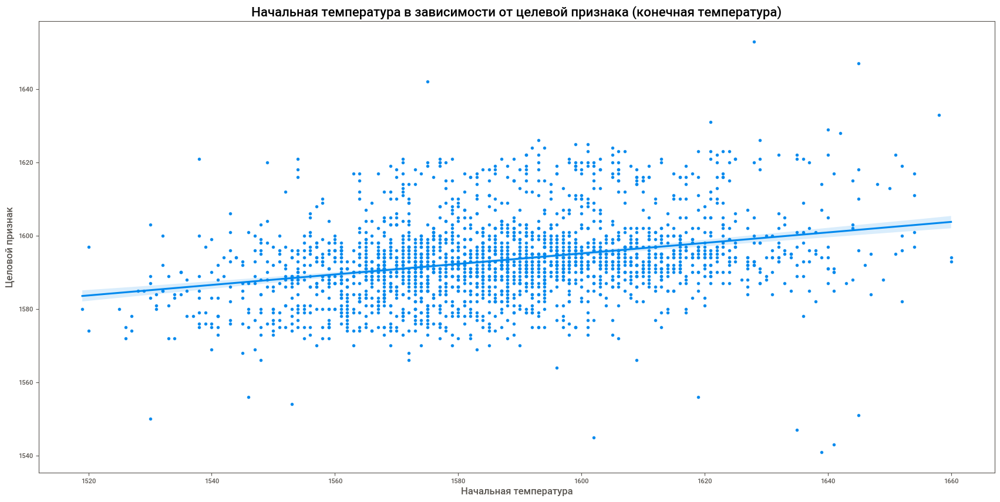

In [211]:
fig, ax = plt.subplots(figsize=(21,10))

sns.scatterplot(final_table, x='initial_temperature', y='target', ax=ax)
sns.regplot(data=final_table, x='initial_temperature', y='target', ax=ax)

ax.set_title(f'Начальная температура в зависимости от целевой признака (конечная температура)', fontsize=16) ;
ax.set_xlabel(f'Начальная температура', fontsize=12);
ax.set_ylabel(f'Целовой признак', fontsize=12);

Похоже, что в качестве отношения мы имеем линейную регрессию, но на самом деле это трудно сказать, поскольку у нас низкая дисперсия. Следует иметь в виду, что увеличение понижения температуры может отрицательно сказаться на характеристиках продукта, и эти различия весьма невелики. 
Мы видим, что конечная температура увеличивается с увеличением начальной температуры.

### Начальная температура в зависимости от целевой признака (конечная температура

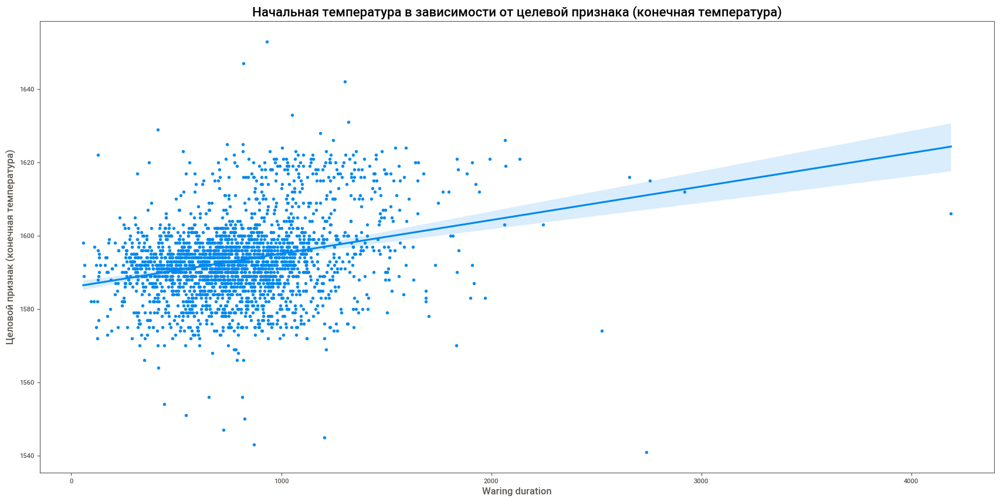

In [212]:
fig, ax = plt.subplots(figsize=(21,10))

sns.scatterplot(final_table, x='warming_duration', y='target', ax=ax)
sns.regplot(data=final_table, x='warming_duration', y='target', ax=ax)

ax.set_title(f'Начальная температура в зависимости от целевой признака (конечная температура)', fontsize=16) ;
ax.set_xlabel(f'Waring duration', fontsize=12);
ax.set_ylabel(f'Целовой признак (конечная температура)', fontsize=12);

Мы видим, что температура увеличивается с увеличением использования электродов, что вполне логично.

# Общее Вывод

Мы устранили одну аномалию в признаке реактивной мощности и поработали над пропусками.

Во время EDA мы заметили, что у нас было много выбросов, некоторые из них были очень существенными, особенно в признаке party_duration (продолжительность процесса ковшового рафинирования) из базы данных про дугих. Мы знаем, что процесс ковшового рафинирования обычно занимает около 50 минут и дольше если необходимые характеристики продукта не достигнуты. 
Но был какой-то очень длительный процесс, который сильно повлиял на целовой признак. 

Перед обучением мы избавлялись от признаков со слишком малым количеством уникальных значений, признаков с незначительной корреляцией с целью или признаков, которые были коллинеарны с другими признаками.

Мы использовали кросс-валидации с метрикой MAE, чтобы определить, какая модель является лучшей среди:
- RandomForestRegressor (случайный лес)
- LGMRegressor (бустингиь)
- MLPRegressor (нейронные сети)
- SVR

Наша лучшая модель — SVR(C=100, gamma=0,1, Solver='rbf'), которая дала нам MAE на 6,07°C и оценку R2 на 48 для нашего набора тестовых данных.

Модель может быть достаточно хорошей, чтобы дать прогноз конечной температуры, однако мы должны помнить, что чем выше или ниже температура, тем больше ошибок будет в предсказаниях.

После анализа важность признаков мы увидели, что у нас есть две очень важные признаки:
- продолжительность прогрева электродов
- начальная температура

Нашими рекомендациями будут лучший мониторинг и контроль входной температуры на входе в ковш, а также оптимизация времени использования электродов на основе результатов модели.

Один из способов улучшить модель — это изображения поверхности ковша. Действительно, один важный аспект потери температуры связан с образованием шлаков, которые выходят на поверхность расплавленного металла. Если бы мы могли иметь изображение поверхности, мы, вероятно, могли бы отслеживать и получать данные об образовании шлаков и состоянии поверхности расплавленного металла и добавлять их в нашу модель. Возможно, мы могли бы даже создать модель, просто используя изображения расплавленной металлической поверхности, чтобы предсказать температуру.